---
# Stereo Camera Calibration Guide

## Overview
This notebook provides a complete pipeline for stereo camera calibration using OpenCV:
- **Monocular calibration** for each camera (intrinsics & distortion)
- **Stereo calibration** to compute the relative pose between cameras
- **Stereo rectification** to align epipolar lines horizontally
- **Live demo** to validate calibration quality in real-time

## Prerequisites
- Two webcams (USB or built-in)
- Printed chessboard calibration pattern on rigid surface
- Python packages: opencv-python, numpy, matplotlib

## Workflow Summary
1. Generate and print calibration pattern
2. Detect available cameras and configure resolution
3. Capture calibration images using guided target poses
4. Perform monocular calibration for left and right cameras
5. Perform stereo calibration to find relative pose
6. Compute stereo rectification transforms
7. Save calibration parameters
8. Validate with live rectified demo

## Expected Results
- Monocular RMS error: < 0.5px (excellent), < 1.0px (good)
- Stereo RMS error: < 0.5px (excellent), < 1.0px (good)
- Vertical alignment after rectification: < 1.0px
---

---
## Mathematical Background (Optional Reading)

<details>
<summary><b>📐 Camera Projection Model</b></summary>

### Pinhole Camera Model

A pinhole camera projects 3D world points to 2D image coordinates:

$$
\begin{bmatrix} u \\ v \\ 1 \end{bmatrix} = \frac{1}{Z} K [R | t] \begin{bmatrix} X \\ Y \\ Z \\ 1 \end{bmatrix}
$$

Where:
- $K$ = Intrinsic matrix (3×3): focal lengths $(f_x, f_y)$ and principal point $(c_x, c_y)$
- $[R | t]$ = Extrinsic matrix (3×4): rotation and translation from world to camera
- $(X, Y, Z)$ = 3D world coordinates
- $(u, v)$ = 2D pixel coordinates
- $Z$ = Depth (distance along camera's optical axis)

### Intrinsic Matrix Structure

$$
K = \begin{bmatrix} 
f_x & 0 & c_x \\ 
0 & f_y & c_y \\ 
0 & 0 & 1 
\end{bmatrix}
$$

- **Focal lengths** $(f_x, f_y)$: Relate metric units to pixels
- **Principal point** $(c_x, c_y)$: Optical axis intersection with image plane (usually near center)
- **Skew** (not shown, typically 0): Axis non-perpendicularity

### Lens Distortion Model

Real lenses have radial and tangential distortion that must be corrected:

**Radial distortion** (barrel/pincushion):
$$
\begin{aligned}
x_{radial} &= x(1 + k_1 r^2 + k_2 r^4 + k_3 r^6) \\
y_{radial} &= y(1 + k_1 r^2 + k_2 r^4 + k_3 r^6)
\end{aligned}
$$

**Tangential distortion** (lens decentering):
$$
\begin{aligned}
x_{tangential} &= 2p_1 xy + p_2(r^2 + 2x^2) \\
y_{tangential} &= p_1(r^2 + 2y^2) + 2p_2 xy
\end{aligned}
$$

**Combined distortion**:
$$
\begin{aligned}
x_{distorted} &= x(1 + k_1 r^2 + k_2 r^4 + k_3 r^6) + 2p_1 xy + p_2(r^2 + 2x^2) \\
y_{distorted} &= y(1 + k_1 r^2 + k_2 r^4 + k_3 r^6) + p_1(r^2 + 2y^2) + 2p_2 xy
\end{aligned}
$$

Where $r^2 = x^2 + y^2$ (normalized distance from principal point).

**Distortion coefficients**: $D = [k_1, k_2, p_1, p_2, k_3]$

**Common patterns**:
- Barrel distortion: $k_1 < 0$ (wide-angle lenses)
- Pincushion distortion: $k_1 > 0$ (telephoto lenses)

</details>

<details>
<summary><b>📐 Stereo Geometry & Epipolar Constraint</b></summary>

### Stereo Camera Configuration

Two cameras observing the same 3D point $P$ create a geometric relationship:

**Relative pose**:
- **Rotation matrix** $R$ (3×3): Orientation of right camera relative to left
- **Translation vector** $T$ (3×1): Position of right camera relative to left
- **Baseline** $b = ||T||$: Distance between camera centers

### Essential Matrix

Relates corresponding points in normalized coordinates:

$$
x_R^T E x_L = 0
$$

Where:
- $E = [T]_\times R$ (Essential matrix, 3×3)
- $[T]_\times$ = Skew-symmetric matrix of $T$
- $x_L, x_R$ = Normalized image coordinates (undistorted)

$$
[T]_\times = \begin{bmatrix} 
0 & -T_z & T_y \\ 
T_z & 0 & -T_x \\ 
-T_y & T_x & 0 
\end{bmatrix}
$$

**Property**: $E$ encodes the epipolar constraint independent of camera intrinsics.

### Fundamental Matrix

Relates corresponding points in pixel coordinates:

$$
p_R^T F p_L = 0
$$

Where:
- $F = K_R^{-T} E K_L^{-1}$ (Fundamental matrix, 3×3)
- $p_L, p_R$ = Pixel coordinates (homogeneous)

**Interpretation**: For any point $p_L$ in the left image, the corresponding point in the right image must lie on the epipolar line:

$$
l_R = F p_L
$$

### Stereo Rectification

**Goal**: Transform both images so epipolar lines become horizontal ($y_L = y_R$).

**Rectification rotations**:
- $R_1$: Rotation applied to left camera
- $R_2$: Rotation applied to right camera
- **Property**: $R_2 = R \cdot R_1$ (maintains relative pose)

**Algorithm** (Bouguet's method):
1. Compute rotation $R_{rect}$ that aligns optical axes with baseline
2. Split rotation approximately evenly: $R_1 \approx R_2^T R$
3. Maximize overlap between rectified views
4. Ensure epipolar lines are horizontal

**Projection matrices** (rectified):
$$
P_1 = \begin{bmatrix} f & 0 & c_x & 0 \\ 0 & f & c_y & 0 \\ 0 & 0 & 1 & 0 \end{bmatrix}, \quad
P_2 = \begin{bmatrix} f & 0 & c_x & -f \cdot b \\ 0 & f & c_y & 0 \\ 0 & 0 & 1 & 0 \end{bmatrix}
$$

Where:
- $f$ = Common focal length (averaged or chosen)
- $(c_x, c_y)$ = Common principal point
- $b$ = Baseline

**Disparity-to-depth mapping** (Q matrix):

$$
\begin{bmatrix} X \\ Y \\ Z \\ W \end{bmatrix} = Q \begin{bmatrix} u \\ v \\ d \\ 1 \end{bmatrix}
$$

Where:
- $d = u_L - u_R$ (disparity)
- $Z = \frac{f \cdot b}{d}$ (depth, extracted from $Z/W$)

$$
Q = \begin{bmatrix} 
1 & 0 & 0 & -c_x \\ 
0 & 1 & 0 & -c_y \\ 
0 & 0 & 0 & f \\ 
0 & 0 & -1/b & (c_x - c_x')/b 
\end{bmatrix}
$$

</details>

<details>
<summary><b>📐 Calibration Optimization</b></summary>

### Reprojection Error

Calibration minimizes the **reprojection error**:

$$
\text{Error} = \frac{1}{N} \sum_{i=1}^{N} \sum_{j=1}^{M} \left\| p_{ij} - \hat{p}_{ij}(K, D, R_i, T_i) \right\|^2
$$

Where:
- $N$ = Number of images
- $M$ = Number of corners per image
- $p_{ij}$ = Detected corner position (observed)
- $\hat{p}_{ij}$ = Projected corner position (predicted)
- $K, D$ = Intrinsic parameters to optimize
- $R_i, T_i$ = Extrinsic parameters for image $i$

**Non-linear optimization**: Levenberg-Marquardt algorithm (robust to noise).

### Physics-Based Constraints

Standard calibration can produce unrealistic results. We add soft constraints:

1. **Square pixels**: $f_x \approx f_y$ (typical CCD/CMOS sensors)
2. **Principal point**: Near image center (manufacturing alignment)
3. **Zero skew**: Perpendicular axes (standard sensor geometry)

**Implementation**: Set OpenCV flags during calibration:
- `cv2.CALIB_FIX_ASPECT_RATIO`: Enforce $f_x = f_y$
- `cv2.CALIB_FIX_PRINCIPAL_POINT`: Fix $(c_x, c_y)$ at image center
- `cv2.CALIB_ZERO_TANGENT_DIST`: Set $p_1 = p_2 = 0$ (if distortion is purely radial)

### Stereo Calibration Quality Metrics

**Good calibration indicators**:
- **RMS error** < 0.5 px (excellent), < 1.0 px (good)
- **Baseline**: Consistent with physical measurement
- **Rotation**: Small angles (cameras should be roughly aligned)
- **Rectification vertical offset**: < 1.0 px

**Poor calibration signs**:
- High per-image variance in errors
- Unrealistic focal lengths (outliers)
- Large rotation angles (unless intentional)

</details>

### Import basic libraries for computer vision and file manipulation

In [7]:
import os
import cv2
import numpy as np
import platform
import matplotlib
import matplotlib.pyplot as plt

In [8]:
print("OpenCV version:", cv2.__version__)
print("NumPy version:", np.__version__)
print("Matplotlib version:", matplotlib.__version__)
# speed up camera access on Windows by using DirectShow backend
backend = cv2.CAP_DSHOW if platform.system() == 'Windows' else cv2.CAP_ANY

OpenCV version: 4.13.0
NumPy version: 2.3.4
Matplotlib version: 3.10.8


---
## 0. Generate Calibration Pattern
* Before calibrating your cameras, you need a physical chessboard pattern
* Use the code below to generate and print a high-quality pattern

In [3]:
def generate_chessboard(squares_x=9, squares_y=6, square_size_mm=30, dpi=300, paper_size="A4"):
    """
    Generate a chessboard calibration pattern centered on a full page.
    
    Parameters:
    -----------
    squares_x : int
        Number of inner corners horizontally (columns - 1)
    squares_y : int
        Number of inner corners vertically (rows - 1)
    square_size_mm : float
        Size of each square in millimeters
    dpi : int
        Dots per inch for output image (300 for high quality printing)
    paper_size : str
        "A4" (210x297mm) or "Letter" (215.9x279.4mm)
    
    Returns:
    --------
    numpy.ndarray : Generated chessboard image on full page
    """
    # Paper dimensions in mm (portrait: width x height)
    paper_dims = {"A4": (210, 297), "Letter": (215.9, 279.4)}
    if paper_size not in paper_dims:
        raise ValueError(f"Unsupported paper size. Use 'A4' or 'Letter'.")
    
    paper_w_mm, paper_h_mm = paper_dims[paper_size]
    # Use landscape orientation (swap width and height)
    paper_w_mm, paper_h_mm = paper_h_mm, paper_w_mm
    mm_to_inch = 0.0393701
    
    # Calculate full page size in pixels
    page_w_px = int(paper_w_mm * mm_to_inch * dpi)
    page_h_px = int(paper_h_mm * mm_to_inch * dpi)
    
    # Create white background (full page)
    background = np.ones((page_h_px, page_w_px), dtype=np.uint8) * 255
    
    # Calculate pattern dimensions
    square_size_px = int(square_size_mm * mm_to_inch * dpi)
    total_squares_x = squares_x + 1
    total_squares_y = squares_y + 1
    pattern_w_px = total_squares_x * square_size_px
    pattern_h_px = total_squares_y * square_size_px
    
    # Validate pattern fits on page
    if pattern_w_px > page_w_px or pattern_h_px > page_h_px:
        max_square_w = int((page_w_px / total_squares_x) / (mm_to_inch * dpi))
        max_square_h = int((page_h_px / total_squares_y) / (mm_to_inch * dpi))
        max_square = min(max_square_w, max_square_h)
        raise ValueError(
            f"Pattern too large for {paper_size} paper!\n"
            f"Pattern size: {pattern_w_px}x{pattern_h_px}px\n"
            f"Paper size: {page_w_px}x{page_h_px}px\n"
            f"Reduce square size to {max_square}mm or fewer, or use fewer squares."
        )
    
    # Center the pattern on the page
    x_offset = (page_w_px - pattern_w_px) // 2
    y_offset = (page_h_px - pattern_h_px) // 2
    
    # Draw chessboard pattern
    for i in range(total_squares_y):
        for j in range(total_squares_x):
            if (i + j) % 2 == 0:
                y_start = y_offset + i * square_size_px
                y_end = y_start + square_size_px
                x_start = x_offset + j * square_size_px
                x_end = x_start + square_size_px
                background[y_start:y_end, x_start:x_end] = 0  # Black squares
    
    return background


def save_calibration_pattern(pattern, filename):
    """
    Save the calibration pattern to a file.
    
    Parameters:
    -----------
    pattern : numpy.ndarray
        The pattern image to save
    filename : str
        Output filename (e.g., 'chessboard.png')
    """
    cv2.imwrite(filename, pattern)
    print(f"Saved: {filename}")
    print(f"Size: {pattern.shape[1]} x {pattern.shape[0]} pixels")
    return pattern

##### Create a 9x6 chessboard pattern

Generating chessboard for Letter paper...
Saved: calibration_chessboard_Letter.png
Size: 3300 x 2550 pixels


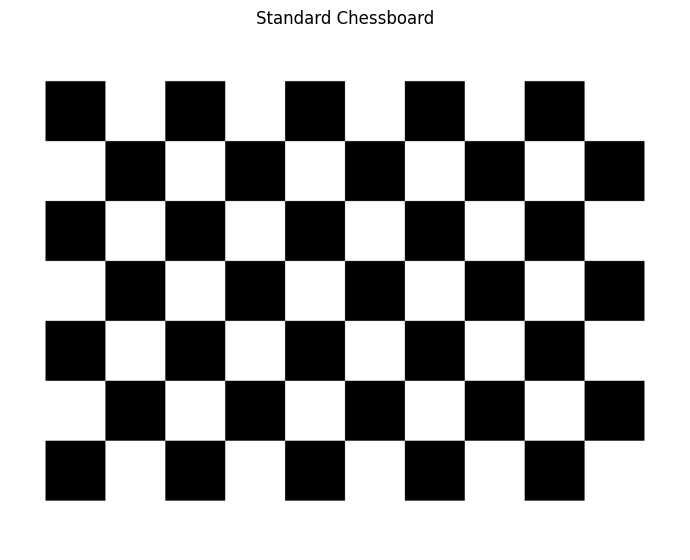


PRINTING INSTRUCTIONS:
Pattern: 9x6 corners, 25mm squares
Paper: Letter

1. Open file: calibration_chessboard_Letter.png
2. Printer settings: Select 'Letter' paper size
3. CRITICAL: Set scaling to '100%' or 'Actual Size'
4. Disable any 'Fit to Page' or 'Scale to Fit' options
5. Print the pattern
6. Mount on rigid, flat surface (foam board)
7. MEASURE actual square size with ruler - update SQUARE_SIZE_MM if different


In [4]:
# Configuration for calibration pattern
PAPER_SIZE = "Letter"          # "A4" or "Letter" - CHANGE THIS for your paper type
PATTERN_SQUARES_X = 9          # Horizontal inner corners (not total squares)
PATTERN_SQUARES_Y = 6          # Vertical inner corners (not total squares)
SQUARE_SIZE_MM = 25            # Size of each square in millimeters (measure after printing!)

# Generate standard chessboard
print(f"Generating chessboard for {PAPER_SIZE} paper...")
chessboard = generate_chessboard(
    squares_x=PATTERN_SQUARES_X,
    squares_y=PATTERN_SQUARES_Y,
    square_size_mm=SQUARE_SIZE_MM,
    dpi=300,
    paper_size=PAPER_SIZE
)
save_calibration_pattern(chessboard, f'calibration_chessboard_{PAPER_SIZE}.png')

# Display both patterns
fig, axes = plt.subplots(1, 1, figsize=(7, 6))
axes.imshow(chessboard, cmap='gray')
axes.set_title('Standard Chessboard')
axes.axis('off')
plt.tight_layout()
plt.show()

print("\nPRINTING INSTRUCTIONS:")
print(f"Pattern: {PATTERN_SQUARES_X}x{PATTERN_SQUARES_Y} corners, {SQUARE_SIZE_MM}mm squares")
print(f"Paper: {PAPER_SIZE}")
print(f"\n1. Open file: calibration_chessboard_{PAPER_SIZE}.png")
print(f"2. Printer settings: Select '{PAPER_SIZE}' paper size")
print("3. CRITICAL: Set scaling to '100%' or 'Actual Size'")
print("4. Disable any 'Fit to Page' or 'Scale to Fit' options")
print("5. Print the pattern")
print("6. Mount on rigid, flat surface (foam board)")
print("7. MEASURE actual square size with ruler - update SQUARE_SIZE_MM if different")

#### Make sure to mount on a rigid, flat surface (tabla macocel)
![Chessboard on rigid surface](./figures/chessboard_on_rigid.jpg)

---
## 1. Camera Detection and Configuration
* List and identify cameras
* Configure resolution settings

Found 4 camera(s):
  Camera 0: 640x480


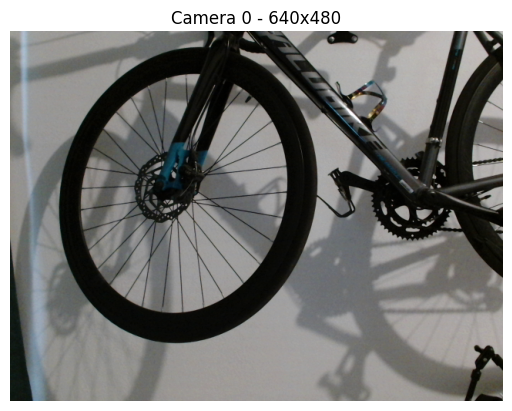

  Camera 1: 640x480


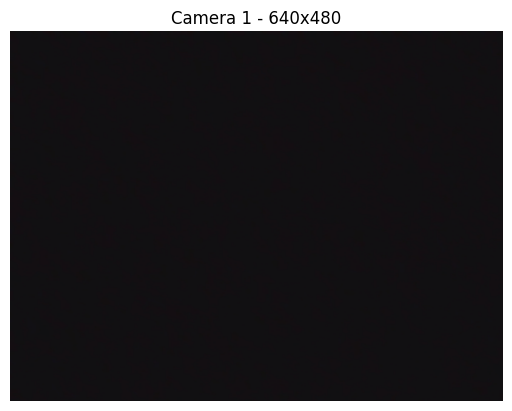

  Camera 2: 640x480


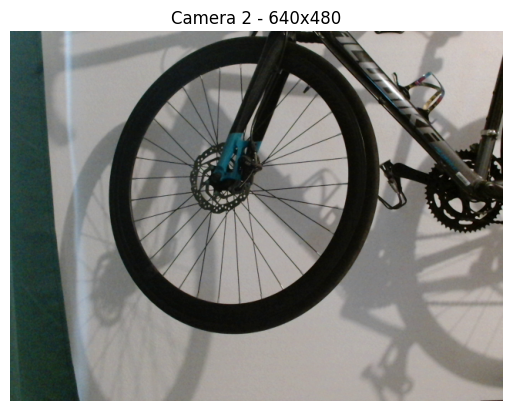

  Camera 3: 1280x720


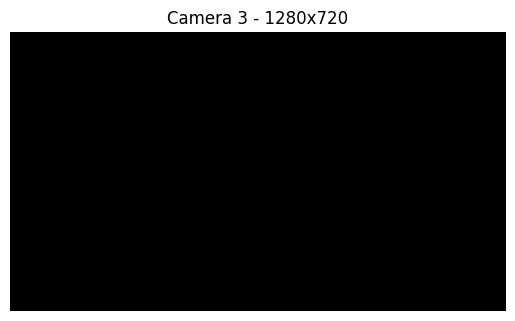

In [8]:
def list_available_cameras(max_cameras=10):
    """Check for available cameras by trying to open them."""
    available_cameras = []
    for i in range(max_cameras):
        cap = cv2.VideoCapture(i, backend)
        if cap.isOpened():
            ret, frame = cap.read()
            if ret:
                # Get camera properties
                width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
                height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
                available_cameras.append({
                    'index': i,
                    'resolution': f"{int(width)}x{int(height)}",
                    'frame': frame
                })
            cap.release()
    
    return available_cameras

# Find all cameras
cameras = list_available_cameras()

print(f"Found {len(cameras)} camera(s):")
for cam in cameras:
    print(f"  Camera {cam['index']}: {cam['resolution']}")
    # Display the first frame from the camera
    plt.imshow(cv2.cvtColor(cam['frame'], cv2.COLOR_BGR2RGB))
    plt.title(f"Camera {cam['index']} - {cam['resolution']}")
    plt.axis('off')
    plt.show()

### 1.1 Identify the **left** and **right** camera indexes (update idx)

In [9]:
cam_left_idx = 2
cam_right_idx = 0

##### Lets explore the resolutions supported by your camera

In [196]:
def get_supported_resolutions(camera_index=0):
    """Test common resolutions to see which ones are supported."""
    # Common resolutions to test
    resolutions = [
        (160, 120),    # QQVGA
        (320, 240),    # QVGA
        (640, 480),    # VGA
        (800, 600),    # SVGA
        (1024, 768),   # XGA
        (1280, 720),   # HD
        (1280, 1024),  # SXGA
        (1600, 1200),  # UXGA
        (1920, 1080),  # Full HD
        (2560, 1440),  # QHD
        (3840, 2160),  # 4K UHD
    ]
    
    supported = []
    cap = cv2.VideoCapture(camera_index, backend)
    
    if not cap.isOpened():
        print(f"Cannot open camera {camera_index}")
        return supported
    
    for width, height in resolutions:
        cap.set(cv2.CAP_PROP_FRAME_WIDTH, width)
        cap.set(cv2.CAP_PROP_FRAME_HEIGHT, height)
        
        # Check what resolution was actually set
        actual_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
        actual_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
        
        if (actual_width, actual_height) == (width, height):
            supported.append((width, height))
    
    cap.release()
    return supported


##### If both cameras are the same, run only onece (e.g. left cam)

In [13]:
# Get supported resolutions for camera N (replace with your camera index)
resolutions = get_supported_resolutions(camera_index=cam_left_idx)

print(f"Supported resolutions for Camera {cam_left_idx}:")
for width, height in resolutions:
    print(f"  {width}x{height}")

Supported resolutions for Camera 2:
  160x120
  320x240
  640x480
  800x600
  1280x720
  1920x1080


### 1.2 Choose resolution for calibration and stereo matching

For disparity matching, smaller resolutions are recommended since computational complexity is O(W×H×D), where W=width, H=height, and D=disparity range. Recommendation, choose **640x480** or **800x600**


In [10]:
width, height = 640, 480

---
## 2. Guided Calibration System - Target Pose Generator

This system provides pre-defined target quadrilaterals for students to align the calibration pattern with.

##### Why Use Guided Target Poses?

**Problem**: Students often capture poor calibration datasets:
- Too many similar poses (redundant information)
- Missing critical angles (poor parameter estimation)
- Insufficient spatial coverage

**Solution**: Pre-generated target quadrilaterals ensure:
1. **Optimal spatial coverage**: Center, corners, edges
2. **Angle diversity**: Frontal, tilted, rotated views
3. **Scale variation**: Near, medium, far distances
4. **Consistency**: All students collect similar quality data

In [77]:
def generate_target_poses(img_width=640, img_height=480, num_poses=20, pattern_aspect_ratio=10/7):
    """
    Generate a set of diverse target quadrilaterals for calibration pattern positioning.
    
    This creates a variety of poses covering:
    - Different positions (center, corners, edges)
    - Various scales (close, medium, far)
    - Multiple angles (frontal, tilted left/right, tilted up/down)
    
    Parameters:
    -----------
    img_width : int
        Camera image width
    img_height : int
        Camera image height
    num_poses : int
        Number of target poses to generate (15-25 recommended)
    pattern_aspect_ratio : float
        Width/height ratio of the pattern (10 squares wide / 7 tall = 1.43)
    
    Returns:
    --------
    list of dict : Each dict contains 'corners' (4 points) and 'description' (pose name)
    """
    poses = []
    
    # Helper function to create a quadrilateral from center, size, and perspective
    def create_quad(center_x, center_y, width, height, tilt_x=0, tilt_y=0, rotation=0):
        """
        Create quadrilateral with realistic 3D perspective projection.
        
        tilt_x: rotation around Y-axis in radians (-0.5 to 0.5, negative = left side tilted away)
        tilt_y: rotation around X-axis in radians (-0.5 to 0.5, negative = top tilted away)
        rotation: in-plane rotation (around Z-axis) in degrees
        """
        # Create 3D rectangle corners (in plane Z=0)
        hw, hh = width / 2, height / 2
        corners_3d = np.array([
            [-hw, -hh, 0],  # Top-left
            [hw, -hh, 0],   # Top-right
            [hw, hh, 0],    # Bottom-right
            [-hw, hh, 0]    # Bottom-left
        ], dtype=np.float32)
        
        # Apply 3D rotations using rotation matrices
        # 1. In-plane rotation (around Z-axis)
        if rotation != 0:
            angle_rad = np.radians(rotation)
            cos_a, sin_a = np.cos(angle_rad), np.sin(angle_rad)
            Rz = np.array([
                [cos_a, -sin_a, 0],
                [sin_a, cos_a, 0],
                [0, 0, 1]
            ])
            corners_3d = corners_3d @ Rz.T
        
        # 2. Rotation around X-axis (vertical tilt)
        if tilt_y != 0:
            angle_y = tilt_y * np.pi * 0.3  # Scale to reasonable angles
            cos_y, sin_y = np.cos(angle_y), np.sin(angle_y)
            Rx = np.array([
                [1, 0, 0],
                [0, cos_y, -sin_y],
                [0, sin_y, cos_y]
            ])
            corners_3d = corners_3d @ Rx.T
        
        # 3. Rotation around Y-axis (horizontal tilt)
        if tilt_x != 0:
            angle_x = tilt_x * np.pi * 0.3  # Scale to reasonable angles
            cos_x, sin_x = np.cos(angle_x), np.sin(angle_x)
            Ry = np.array([
                [cos_x, 0, sin_x],
                [0, 1, 0],
                [-sin_x, 0, cos_x]
            ])
            corners_3d = corners_3d @ Ry.T
        
        # Translate in 3D space (move board away from camera)
        # Distance affects perspective strength
        distance = max(img_width, img_height) * 1.2
        corners_3d[:, 2] += distance
        
        # Camera intrinsic parameters (simplified)
        focal_length = distance  # Moderate perspective
        cx, cy = img_width / 2, img_height / 2
        
        # Perspective projection: P = K * [X/Z, Y/Z]
        corners_2d = np.zeros((4, 2), dtype=np.float32)
        for i, pt in enumerate(corners_3d):
            x, y, z = pt
            if z > 0:  # Ensure point is in front of camera
                corners_2d[i, 0] = focal_length * (x / z)
                corners_2d[i, 1] = focal_length * (y / z)
            else:
                corners_2d[i] = [0, 0]  # Fallback for invalid points
        
        # Translate to desired center position
        corners_2d[:, 0] += center_x
        corners_2d[:, 1] += center_y
        
        return corners_2d.astype(np.int32)
    
    # Define base pattern size (medium scale, ~40% of image)
    base_width = int(img_width * 0.4)
    base_height = int(base_width / pattern_aspect_ratio)
    
    # 1. Frontal poses at different positions and scales
    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width, base_height),
        'description': '1. Center - Frontal - Medium'
    })
    
    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width*1.3, base_height*1.3),
        'description': '2. Center - Frontal - Large'
    })
    
    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width*0.7, base_height*0.7),
        'description': '3. Center - Frontal - Small'
    })
    
    # 2. Four corners (smaller scale, frontal)
    margin = int(base_width * 0.6)
    poses.append({
        'corners': create_quad(margin, margin, base_width*0.8, base_height*0.8),
        'description': '4. Top-Left Corner'
    })
    
    poses.append({
        'corners': create_quad(img_width-margin, margin, base_width*0.8, base_height*0.8),
        'description': '5. Top-Right Corner'
    })
    
    poses.append({
        'corners': create_quad(margin, img_height-margin, base_width*0.8, base_height*0.8),
        'description': '6. Bottom-Left Corner'
    })
    
    poses.append({
        'corners': create_quad(img_width-margin, img_height-margin, base_width*0.8, base_height*0.8),
        'description': '7. Bottom-Right Corner'
    })
    
    # 3. Edge positions
    poses.append({
        'corners': create_quad(img_width//2, margin, base_width*0.9, base_height*0.9),
        'description': '8. Top Edge'
    })
    
    poses.append({
        'corners': create_quad(img_width//2, img_height-margin, base_width*0.9, base_height*0.9),
        'description': '9. Bottom Edge'
    })
    
    poses.append({
        'corners': create_quad(margin, img_height//2, base_width*0.9, base_height*0.9),
        'description': '10. Left Edge'
    })
    
    poses.append({
        'corners': create_quad(img_width-margin, img_height//2, base_width*0.9, base_height*0.9),
        'description': '11. Right Edge'
    })
    
    # 4. Tilted poses - horizontal tilts
    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width, base_height, tilt_x=-0.6),
        'description': '12. Center - Tilted Left'
    })
    
    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width, base_height, tilt_x=0.6),
        'description': '13. Center - Tilted Right'
    })
    
    # 5. Tilted poses - vertical tilts
    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width, base_height, tilt_y=-0.6),
        'description': '14. Center - Tilted Up'
    })
    
    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width, base_height, tilt_y=0.6),
        'description': '15. Center - Tilted Down'
    })
    
    # 6. Combined tilts (more challenging)
    poses.append({
        'corners': create_quad(img_width//3, img_height//3, base_width*0.9, base_height*0.9, 
                              tilt_x=-0.4, tilt_y=-0.4),
        'description': '16. Top-Left - Tilted'
    })
    
    poses.append({
        'corners': create_quad(2*img_width//3, img_height//3, base_width*0.9, base_height*0.9,
                              tilt_x=0.4, tilt_y=-0.4),
        'description': '17. Top-Right - Tilted'
    })
    
    
    poses.append({
        'corners': create_quad(2*img_width//3, 2*img_height//3, base_width*0.9, base_height*0.9,
                              tilt_x=0.4, tilt_y=0.4),
        'description': '18. Bottom-Right - Tilted'
    })
    
    # 7. Rotated poses at different positions
    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width, base_height, rotation=25),
        'description': '19. Center - Rotated 25 degrees'
    })

    poses.append({
        'corners': create_quad(img_width//2, img_height//2, base_width, base_height, rotation=90,
                              tilt_x=0.0, tilt_y=0.5),
        'description': '20. Center - Rotated 90 degrees + Tilted Down'
    })
    
    poses.append({
        'corners': create_quad(img_width//4, img_height//4, base_width*0.7, base_height*0.7, rotation=-30),
        'description': '21. Top-Left - Rotated -30 degrees'
    })
    
    poses.append({
        'corners': create_quad(3*img_width//4, img_height//4, base_width*0.7, base_height*0.7, rotation=35),
        'description': '22. Top-Right - Rotated 35 degrees'
    })
    
    poses.append({
        'corners': create_quad(img_width//4, 3*img_height//4, base_width*0.7, base_height*0.7, rotation=40),
        'description': '23. Bottom-Left - Rotated 40 degrees'
    })
    
    poses.append({
        'corners': create_quad(3*img_width//4, 3*img_height//4, base_width*0.7, base_height*0.7, rotation=-20),
        'description': '24. Bottom-Right - Rotated -20 degrees'
    })
    
    return poses[:num_poses]

In [200]:
def visualize_target_poses(poses, img_width=640, img_height=480):
    """
    Visualize all target poses in a grid layout.
    This helps instructors/students preview all required positions.
    """
    num_poses = len(poses)
    cols = 6
    rows = (num_poses + cols - 1) // cols
    
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(rows, cols, figsize=(15, 3*rows))
        axes = axes.flatten() if num_poses > 1 else [axes]
    
    for idx, pose in enumerate(poses):
        # Create blank image
        img = np.ones((img_height, img_width, 3), dtype=np.uint8) * 100
        
        # Draw target quadrilateral
        corners = pose['corners'].reshape((-1, 1, 2))
        cv2.polylines(img, [corners], True, (0, 200, 0), 3)
        
        # Fill with semi-transparent green
        overlay = img.copy()
        cv2.fillPoly(overlay, [corners], (100, 255, 100))
        cv2.addWeighted(overlay, 0.3, img, 0.7, 0, img)
        
        # Draw corner numbers
        for i, corner in enumerate(pose['corners']):
            cv2.circle(img, tuple(corner), 5, (255, 0, 0), -1)
            cv2.putText(img, str(i+1), tuple(corner + [10, 10]), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        
        # Display
        axes[idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[idx].set_title(pose['description'], fontsize=8)
        axes[idx].axis('off')
    
    # Hide unused subplots
    for idx in range(num_poses, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()


### 2.1 Generate and visualize target poses

Generated 24 target poses for calibration

Pose List:
  1. Center - Frontal - Medium
  2. Center - Frontal - Large
  3. Center - Frontal - Small
  4. Top-Left Corner
  5. Top-Right Corner
  6. Bottom-Left Corner
  7. Bottom-Right Corner
  8. Top Edge
  9. Bottom Edge
  10. Left Edge
  11. Right Edge
  12. Center - Tilted Left
  13. Center - Tilted Right
  14. Center - Tilted Up
  15. Center - Tilted Down
  16. Top-Left - Tilted
  17. Top-Right - Tilted
  18. Bottom-Right - Tilted
  19. Center - Rotated 25°
  20. Center - Rotated 90° + Tilted Down
  21. Top-Left - Rotated -30°
  22. Top-Right - Rotated 35°
  23. Bottom-Left - Rotated 40°
  24. Bottom-Right - Rotated -20°


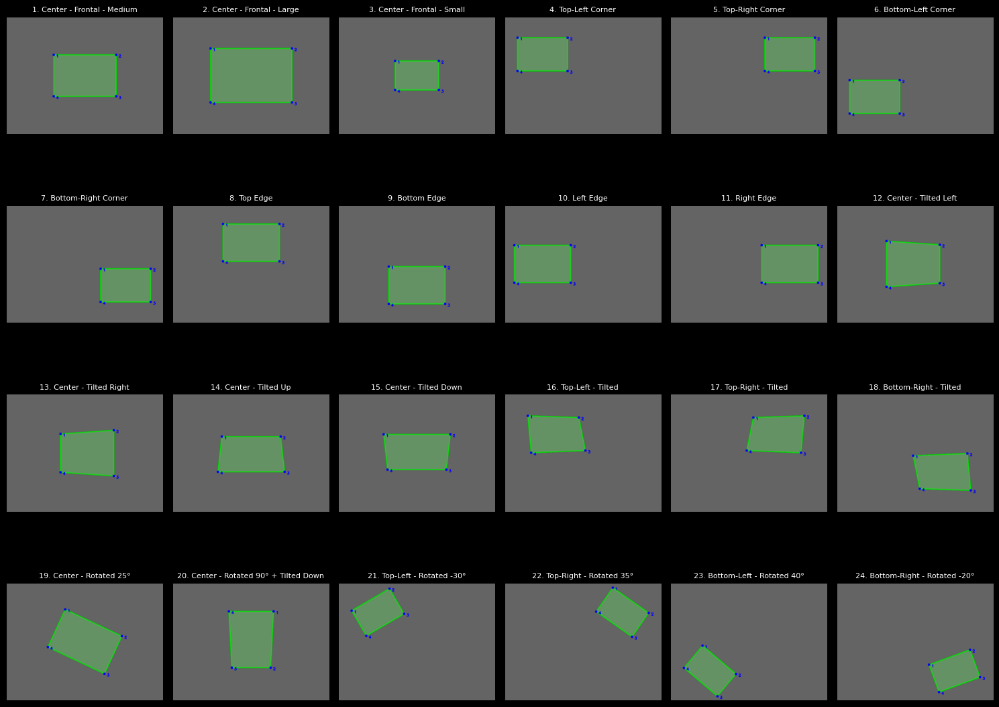

In [199]:
target_poses = generate_target_poses(
    img_width=width, 
    img_height=height, 
    num_poses=24,
    pattern_aspect_ratio=(PATTERN_SQUARES_X) / (PATTERN_SQUARES_Y)
)

print(f"Generated {len(target_poses)} target poses for calibration")
print("\nPose List:")
for pose in target_poses:
    print(f"  {pose['description']}")

visualize_target_poses(target_poses, width, height)

---
## 3. Guided Calibration Interface
Interactive system that shows students where to position the pattern in real-time.

The alignment score combines multiple geometric features:
- **Position**: Distance between detected and target centroids
- **Scale**: Ratio of bounding box sizes
- **Orientation**: Angular difference
- **Shape**: IoU (Intersection over Union) similarity

Score ranges from 0.0 (poor) to 1.0 (perfect alignment).
Threshold: > 0.85 automatically captures the frame.

In [49]:
def calculate_pose_alignment(detected_corners, target_quad, pattern_size):
    """
    Calculate how well the detected chessboard corners align with the target pose.
    Uses multiple geometric features: position, scale, orientation, and shape similarity.
    
    Parameters:
    -----------
    detected_corners : numpy.ndarray
        Detected chessboard corners (Nx1x2)
    target_quad : numpy.ndarray
        Target quadrilateral corners (4x2)
    pattern_size : tuple
        (squares_x, squares_y) - number of inner corners
    
    Returns:
    --------
    float : Alignment score (0-1, where 1 is perfect alignment)
    """
    # Get the 4 corner points of the detected chessboard pattern
    corners_2d = detected_corners.reshape(-1, 2)
    squares_x, squares_y = pattern_size
    
    # Extract outer corners of detected pattern
    detected_quad = np.array([
        corners_2d[0],                    # Top-left
        corners_2d[squares_x - 1],        # Top-right
        corners_2d[-1],                   # Bottom-right
        corners_2d[-squares_x]            # Bottom-left
    ])
    
    # 1. Position score: average corner distance
    distances = np.linalg.norm(detected_quad - target_quad, axis=1)
    avg_distance = np.mean(distances)
    target_width = np.linalg.norm(target_quad[1] - target_quad[0])
    target_height = np.linalg.norm(target_quad[3] - target_quad[0])
    target_size = (target_width + target_height) / 2
    position_score = max(0, 1 - avg_distance / (target_size * 0.3))
    
    # 2. Scale score: compare detected and target sizes
    detected_width = np.linalg.norm(detected_quad[1] - detected_quad[0])
    detected_height = np.linalg.norm(detected_quad[3] - detected_quad[0])
    detected_size = (detected_width + detected_height) / 2
    scale_ratio = detected_size / target_size
    scale_score = 1.0 - min(abs(1.0 - scale_ratio), 0.5) / 0.5  # Allow ±50% scale difference
    
    # 3. Orientation score: compare edge angles (line parallelism)
    def get_edge_angle(p1, p2):
        """Calculate angle of edge from p1 to p2"""
        delta = p2 - p1
        return np.arctan2(delta[1], delta[0])
    
    # Compare top edges
    target_top_angle = get_edge_angle(target_quad[0], target_quad[1])
    detected_top_angle = get_edge_angle(detected_quad[0], detected_quad[1])
    angle_diff_top = abs(target_top_angle - detected_top_angle)
    # Normalize to [0, pi]
    angle_diff_top = min(angle_diff_top, 2*np.pi - angle_diff_top)
    
    # Compare left edges
    target_left_angle = get_edge_angle(target_quad[0], target_quad[3])
    detected_left_angle = get_edge_angle(detected_quad[0], detected_quad[3])
    angle_diff_left = abs(target_left_angle - detected_left_angle)
    angle_diff_left = min(angle_diff_left, 2*np.pi - angle_diff_left)
    
    # Average angle difference (allow up to 30° = 0.52 rad)
    avg_angle_diff = (angle_diff_top + angle_diff_left) / 2
    orientation_score = max(0, 1 - avg_angle_diff / 0.52)
    
    # 4. Shape score: aspect ratio similarity
    target_aspect = target_width / max(target_height, 1e-6)
    detected_aspect = detected_width / max(detected_height, 1e-6)
    aspect_ratio = detected_aspect / max(target_aspect, 1e-6)
    shape_score = 1.0 - min(abs(1.0 - aspect_ratio), 0.3) / 0.3
    
    # Weighted combination (emphasize geometry over exact position for tilted poses)
    alignment_score = (
        position_score * 0.35 +      # Position less critical for tilts
        scale_score * 0.25 +         # Size similarity important
        orientation_score * 0.25 +   # Orientation/parallelism critical
        shape_score * 0.15           # Aspect ratio verification
    )
    
    return max(0, min(1, alignment_score))


def calculate_focus_score(gray_image):
    """
    Calculate image focus/sharpness using Laplacian variance.
    Higher values indicate sharper (better focused) images.
    
    Parameters:
    -----------
    gray_image : numpy.ndarray
        Grayscale image
    
    Returns:
    --------
    float : Focus score (higher = sharper)
    """
    laplacian = cv2.Laplacian(gray_image, cv2.CV_64F)
    focus_score = laplacian.var()
    return focus_score


def is_board_stable(current_corners, previous_corners, max_movement=2.0):
    """
    Check if the chessboard is stable (not moving) between frames.
    
    Parameters:
    -----------
    current_corners : numpy.ndarray
        Current frame corners (Nx1x2)
    previous_corners : numpy.ndarray or None
        Previous frame corners (Nx1x2)
    max_movement : float
        Maximum allowed average corner movement in pixels
    
    Returns:
    --------
    bool : True if board is stable
    """
    if previous_corners is None:
        return False
    
    current_2d = current_corners.reshape(-1, 2)
    previous_2d = previous_corners.reshape(-1, 2)
    
    # Calculate movement for each corner
    movements = np.linalg.norm(current_2d - previous_2d, axis=1)
    avg_movement = np.mean(movements)
    
    return avg_movement < max_movement

### 3.1 GUI for guided dataset capturing

In [207]:
def guided_calibration_capture(camera_index, target_poses, squares_x=9, squares_y=6, square_size_mm=25, 
                              auto_capture=True, alignment_threshold=0.85, focus_threshold=100.0, 
                              stability_frames=5):
    """
    Interactive guided calibration that shows students where to position the chessboard pattern.
    Supports automatic capture when board is aligned, focused, and stable.
    
    Parameters:
    -----------
    camera_index : int
        Camera to use for calibration
    target_poses : list
        List of target pose dictionaries from generate_target_poses()
    squares_x, squares_y : int
        Number of inner corners in the chessboard pattern (not total squares)
    square_size_mm : float
        Size of each square in mm
    auto_capture : bool
        Enable automatic capture when alignment, focus, and stability criteria are met
    alignment_threshold : float
        Minimum alignment score (0-1) required for auto-capture
    focus_threshold : float
        Minimum focus score (Laplacian variance) required for auto-capture
    stability_frames : int
        Number of consecutive stable frames required before auto-capture
    
    Returns:
    --------
    tuple : (captured_images, detected_corners, object_points)
    """
    cap = cv2.VideoCapture(camera_index, backend)
    cap.set(cv2.CAP_PROP_FRAME_WIDTH, width)
    cap.set(cv2.CAP_PROP_FRAME_HEIGHT, height)
    cap.set(cv2.CAP_PROP_AUTOFOCUS, 0)  # Disable autofocus for consistency

    
    if not cap.isOpened():
        print(f"Failed to open camera {camera_index}")
        return None, None, None
    
    # Setup chessboard pattern detection
    pattern_size = (squares_x, squares_y)
    
    captured_images = []
    detected_corners = []
    object_points = []
    current_pose_idx = 0
    
    # Auto-capture state tracking
    previous_corners = None
    stable_frame_count = 0
    
    print("\n GUIDED CALIBRATION SYSTEM - CHESSBOARD")
    print("=" * 60)
    print(f"Pattern: {squares_x}x{squares_y} inner corners")
    print(f"Auto-capture: {'ENABLED' if auto_capture else 'DISABLED'}")
    if auto_capture:
        print(f"  - Alignment threshold: {alignment_threshold:.1%}")
        print(f"  - Focus threshold: {focus_threshold:.1f}")
        print(f"  - Stability frames: {stability_frames}")
    print("\nInstructions:")
    print("  • GREEN quadrilateral = target position")
    print("  • CYAN quadrilateral = detected chessboard")
    print("  • Match colored corners: 1=Red, 2=Green, 3=Blue, 4=Yellow")
    print("  • Align the physical pattern with the green target")
    if auto_capture:
        print("  • Hold steady - auto-capture when aligned, focused & stable")
    else:
        print("  • Press SPACE when aligned to capture")
    print("  • Press 's' to skip current pose")
    print("  • Press 'q' to quit")
    print("=" * 60)
    
    while current_pose_idx < len(target_poses):
        ret, frame = cap.read()
        if not ret:
            print("Failed to read frame")
            break
        
        display_frame = frame.copy()
        current_pose = target_poses[current_pose_idx]
        
        # Draw target quadrilateral (green)
        target_corners = current_pose['corners'].reshape((-1, 1, 2))
        cv2.polylines(display_frame, [target_corners], True, (0, 255, 0), 3)
        
        # Define corner colors (BGR format) - same for target and detected
        corner_colors = [
            (0, 0, 255),    # Corner 1: Red
            (255, 0, 255),    # Corner 2: Magenta
            (255, 0, 0),    # Corner 3: Blue
            (0, 255, 255)   # Corner 4: Yellow
        ]
        
        # Draw target corner points with unique colors
        for i, corner in enumerate(current_pose['corners']):
            cv2.circle(display_frame, tuple(corner), 7, corner_colors[i], -1)
            # Add black border for visibility
            cv2.circle(display_frame, tuple(corner), 7, (0, 0, 0), 2)
            cv2.putText(display_frame, str(i+1), tuple(corner + [10, -10]), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.6, corner_colors[i], 2)
        
        # Semi-transparent fill
        overlay = display_frame.copy()
        cv2.fillPoly(overlay, [target_corners], (0, 255, 0))
        cv2.addWeighted(overlay, 0.2, display_frame, 0.8, 0, display_frame)
        
        # Detect chessboard pattern in current frame
        detected = False
        pattern_corners = None
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        # Use FAST_CHECK flag to quickly reject frames without chessboard (reduces lag)
        ret, corners = cv2.findChessboardCorners(gray, pattern_size, 
                                                  cv2.CALIB_CB_FAST_CHECK)
        
        if ret:
            # Refine corner detection for better accuracy
            criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
            corners_refined = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
            
            detected = True
            pattern_corners = corners_refined
            
            # Extract 4 outer corners of detected pattern for visualization
            corners_2d = corners_refined.reshape(-1, 2)
            detected_quad = np.array([
                corners_2d[0],                      # Top-left
                corners_2d[pattern_size[0] - 1],    # Top-right
                corners_2d[-1],                     # Bottom-right
                corners_2d[-pattern_size[0]]        # Bottom-left
            ], dtype=np.int32)
            
            # Draw detected quadrilateral (white)
            detected_quad_reshaped = detected_quad.reshape((-1, 1, 2))
            cv2.polylines(display_frame, [detected_quad_reshaped], True, (255, 255, 255), 2)
            
            # Draw detected corner points with matching colors
            for i, corner in enumerate(detected_quad):
                cv2.circle(display_frame, tuple(corner), 7, corner_colors[i], -1)
                # Add white border for visibility
                cv2.circle(display_frame, tuple(corner), 7, (255, 255, 255), 2)
                cv2.putText(display_frame, str(i+1), tuple(corner + [10, 10]), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, corner_colors[i], 2)
        
        # Auto-capture logic
        auto_capture_ready = False
        alignment_score = 0.0
        focus_score = 0.0
        is_stable = False
        
        if detected and auto_capture:
            # Check alignment with target pose
            alignment_score = calculate_pose_alignment(
                pattern_corners, 
                current_pose['corners'], 
                pattern_size
            )
            
            # Check focus/sharpness
            focus_score = calculate_focus_score(gray)
            
            # Check stability (more forgiving movement threshold for easier capture)
            is_stable = is_board_stable(pattern_corners, previous_corners, max_movement=1.5)
            
            # Update stability counter
            if alignment_score >= alignment_threshold and focus_score >= focus_threshold and is_stable:
                stable_frame_count += 1
            else:
                stable_frame_count = 0
            
            # Check if ready for auto-capture
            if stable_frame_count >= stability_frames:
                auto_capture_ready = True
            
            # Store current corners for next frame comparison
            previous_corners = pattern_corners.copy()
        else:
            # Reset stability tracking
            previous_corners = None
            stable_frame_count = 0
        
        # Status display
        status_y = 30
        cv2.putText(display_frame, f"Pose {current_pose_idx + 1}/{len(target_poses)}: {current_pose['description']}", 
                   (10, status_y), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 6)
        cv2.putText(display_frame, f"Pose {current_pose_idx + 1}/{len(target_poses)}: {current_pose['description']}", 
                   (10, status_y), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 2)
        
        if detected:
            if auto_capture:
                # Show auto-capture status
                status_color = (0, 255, 0) if auto_capture_ready else (0, 255, 255)
                status_text = f"Align: {alignment_score:.1%} | Focus: {focus_score:.0f} | Stable: {stable_frame_count}/{stability_frames}"
                cv2.putText(display_frame, status_text, 
                           (10, status_y + 30), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 6)
                cv2.putText(display_frame, status_text, 
                           (10, status_y + 30), cv2.FONT_HERSHEY_SIMPLEX, 0.5, status_color, 2)
                
                if auto_capture_ready:
                    cv2.putText(display_frame, "AUTO-CAPTURING...", 
                               (10, status_y + 55), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 6)
                    cv2.putText(display_frame, "AUTO-CAPTURING...", 
                               (10, status_y + 55), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
            else:
                cv2.putText(display_frame, "PATTERN DETECTED - Press SPACE to capture", 
                           (10, status_y + 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 6)
                cv2.putText(display_frame, "PATTERN DETECTED - Press SPACE to capture", 
                           (10, status_y + 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        else:
            cv2.putText(display_frame, "Position pattern inside green target...", 
                       (10, status_y + 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 6)
        
            cv2.putText(display_frame, "Position pattern inside green target...", 
                       (10, status_y + 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)
        
        cv2.imshow('Guided Calibration', display_frame)
        
        key = cv2.waitKey(1) & 0xFF
        
        # Auto-capture trigger
        if auto_capture_ready:
            captured_images.append(frame.copy())
            detected_corners.append(pattern_corners)
            
            # Create 3D object points for the chessboard
            objp = np.zeros((squares_x * squares_y, 3), np.float32)
            objp[:, :2] = np.mgrid[0:squares_x, 0:squares_y].T.reshape(-1, 2)
            objp *= (square_size_mm / 1000.0)  # Convert to meters
            object_points.append(objp)
            
            print(f"AUTO-CAPTURED pose {current_pose_idx + 1}: {current_pose['description']} "
                  f"(align={alignment_score:.1%}, focus={focus_score:.0f})")
            current_pose_idx += 1
            
            # Reset auto-capture state
            stable_frame_count = 0
            previous_corners = None
            
            # Brief pause to avoid capturing multiple times
            cv2.waitKey(500)
        
        # Manual capture with SPACE
        if key == ord(' '):  # Space - capture
            if detected:
                captured_images.append(frame.copy())
                detected_corners.append(pattern_corners)
                
                # Create 3D object points for the chessboard
                objp = np.zeros((squares_x * squares_y, 3), np.float32)
                objp[:, :2] = np.mgrid[0:squares_x, 0:squares_y].T.reshape(-1, 2)
                objp *= (square_size_mm / 1000.0)  # Convert to meters
                object_points.append(objp)
                
                print(f"MANUAL capture pose {current_pose_idx + 1}: {current_pose['description']}")
                current_pose_idx += 1
                
                # Reset auto-capture state
                stable_frame_count = 0
                previous_corners = None
            else:
                print("Cannot capture - chessboard not detected!")
        
        elif key == ord('s'):  # Skip
            print(f"Skipped pose {current_pose_idx + 1}")
            current_pose_idx += 1
        
        elif key == ord('q'):  # Quit
            print("\n Calibration cancelled by user")
            break
    
    cap.release()
    cv2.destroyAllWindows()
    
    print(f"\nCalibration capture complete!")
    print(f"   Captured {len(captured_images)} images out of {len(target_poses)} target poses")
    
    return captured_images, detected_corners, object_points


### 3.2 Left Camera Dataset Capture

In [208]:
left_captured_imgs, left_corners, left_obj_pts = guided_calibration_capture(
    camera_index=cam_left_idx,
    target_poses=target_poses,
    squares_x=PATTERN_SQUARES_X,
    squares_y=PATTERN_SQUARES_Y,
    square_size_mm=SQUARE_SIZE_MM,
    alignment_threshold=0.85
)


 GUIDED CALIBRATION SYSTEM - CHESSBOARD
Pattern: 9x6 inner corners
Auto-capture: ENABLED
  - Alignment threshold: 85.0%
  - Focus threshold: 100.0
  - Stability frames: 5

Instructions:
  • GREEN quadrilateral = target position
  • CYAN quadrilateral = detected chessboard
  • Match colored corners: 1=Red, 2=Green, 3=Blue, 4=Yellow
  • Align the physical pattern with the green target
  • Hold steady - auto-capture when aligned, focused & stable
  • Press 's' to skip current pose
  • Press 'q' to quit
AUTO-CAPTURED pose 1: 1. Center - Frontal - Medium (align=85.8%, focus=339)
AUTO-CAPTURED pose 2: 2. Center - Frontal - Large (align=87.5%, focus=164)
AUTO-CAPTURED pose 3: 3. Center - Frontal - Small (align=85.3%, focus=423)
AUTO-CAPTURED pose 4: 4. Top-Left Corner (align=85.2%, focus=688)
AUTO-CAPTURED pose 5: 5. Top-Right Corner (align=86.0%, focus=563)
AUTO-CAPTURED pose 6: 6. Bottom-Left Corner (align=85.7%, focus=652)
AUTO-CAPTURED pose 7: 7. Bottom-Right Corner (align=86.3%, focus=7

### 3.3 Right Camera Dataset Capture

In [225]:
right_captured_imgs, right_corners, right_obj_pts = guided_calibration_capture(
    camera_index=cam_right_idx,
    target_poses=target_poses,
    squares_x=PATTERN_SQUARES_X,
    squares_y=PATTERN_SQUARES_Y,
    square_size_mm=SQUARE_SIZE_MM,
    alignment_threshold=0.85
)


 GUIDED CALIBRATION SYSTEM - CHESSBOARD
Pattern: 9x6 inner corners
Auto-capture: ENABLED
  - Alignment threshold: 85.0%
  - Focus threshold: 100.0
  - Stability frames: 5

Instructions:
  • GREEN quadrilateral = target position
  • CYAN quadrilateral = detected chessboard
  • Match colored corners: 1=Red, 2=Green, 3=Blue, 4=Yellow
  • Align the physical pattern with the green target
  • Hold steady - auto-capture when aligned, focused & stable
  • Press 's' to skip current pose
  • Press 'q' to quit
AUTO-CAPTURED pose 1: 1. Center - Frontal - Medium (align=86.1%, focus=375)
AUTO-CAPTURED pose 2: 2. Center - Frontal - Large (align=86.8%, focus=283)
AUTO-CAPTURED pose 3: 3. Center - Frontal - Small (align=85.7%, focus=515)
AUTO-CAPTURED pose 4: 4. Top-Left Corner (align=85.8%, focus=742)
AUTO-CAPTURED pose 5: 5. Top-Right Corner (align=85.5%, focus=660)
AUTO-CAPTURED pose 6: 6. Bottom-Left Corner (align=88.6%, focus=611)
AUTO-CAPTURED pose 7: 7. Bottom-Right Corner (align=86.4%, focus=8

### 3.4 Visualize and Save Captured Frames

Display all captured calibration frames in a grid and optionally save them to disk

In [218]:
def display_captured_frames(captured_images, target_poses, save_dir=None, show_target_guide=False, show_detected_board=True):
    """
    Display and optionally save the captured calibration frames in a grid layout.
    
    Parameters:
    -----------
    captured_images : list
        List of captured image arrays (BGR format)
    target_poses : list
        List of target pose dictionaries with descriptions
    save_dir : str or None
        Directory to save images. If None, images are not saved.
    show_target_guide : bool
        Overlay the target pose quadrilateral on each frame (default: False)
    show_detected_board : bool
        Draw the detected chessboard edges on each frame (default: True)
    
    Returns:
    --------
    None
    """
    if len(captured_images) == 0:
        print("No images to display!")
        return
    
    # Create save directory if needed
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)
        print(f"Saving images to: {save_dir}")
    
    # Calculate grid dimensions
    num_images = len(captured_images)
    cols = 4
    rows = (num_images + cols - 1) // cols
    
    # Create figure with dark background
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(rows, cols, figsize=(16, 4*rows))
        axes = axes.flatten() if num_images > 1 else [axes]
    
    for idx, (img, pose) in enumerate(zip(captured_images, target_poses)):
        # Create display copy
        display_img = img.copy()
        
        # Detect and draw chessboard if requested
        if show_detected_board:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            ret, corners = cv2.findChessboardCorners(gray, (PATTERN_SQUARES_X, PATTERN_SQUARES_Y), 
                                                      cv2.CALIB_CB_FAST_CHECK)
            if ret:
                # Refine corners
                criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
                corners_refined = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
                
                # Draw all detected chessboard corners
                cv2.drawChessboardCorners(display_img, (PATTERN_SQUARES_X, PATTERN_SQUARES_Y), 
                                         corners_refined, ret)
        
        # Draw target pose overlay if requested
        if show_target_guide:
            target_corners = pose['corners'].reshape((-1, 1, 2))
            cv2.polylines(display_img, [target_corners], True, (0, 255, 0), 2)
            
            # Semi-transparent fill
            overlay = display_img.copy()
            cv2.fillPoly(overlay, [target_corners], (0, 255, 0))
            cv2.addWeighted(overlay, 0.15, display_img, 0.85, 0, display_img)
        
        # Convert BGR to RGB for display
        img_rgb = cv2.cvtColor(display_img, cv2.COLOR_BGR2RGB)
        
        # Display image
        axes[idx].imshow(img_rgb)
        axes[idx].set_title(pose['description'], fontsize=10, pad=5)
        axes[idx].axis('off')
        
        # Save image if directory provided (save with overlay if guide is shown)
        if save_dir is not None:
            # Create filename from pose description
            filename = f"frame_{pose['description'].replace(' ', '_').replace('.', '').replace('-', '').replace('°', 'deg')}.png"
            filepath = os.path.join(save_dir, filename)
            cv2.imwrite(filepath, img)
    
    # Hide unused subplots
    for idx in range(num_images, len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"\n{'='*60}")
    print(f"CAPTURED FRAMES SUMMARY")
    print(f"{'='*60}")
    print(f"Total frames captured: {len(captured_images)}")
    print(f"Image resolution: {captured_images[0].shape[1]}x{captured_images[0].shape[0]}")
    
    if save_dir is not None:
        print(f"\n✓ All {len(captured_images)} images saved to: {save_dir}")
        print(f"  Format: PNG")
        print(f"  Naming: frame_XX_[pose_description].png")
    
    print(f"{'='*60}\n")

#### Visualize left camera frames

Saving images to: calibration_frames_left


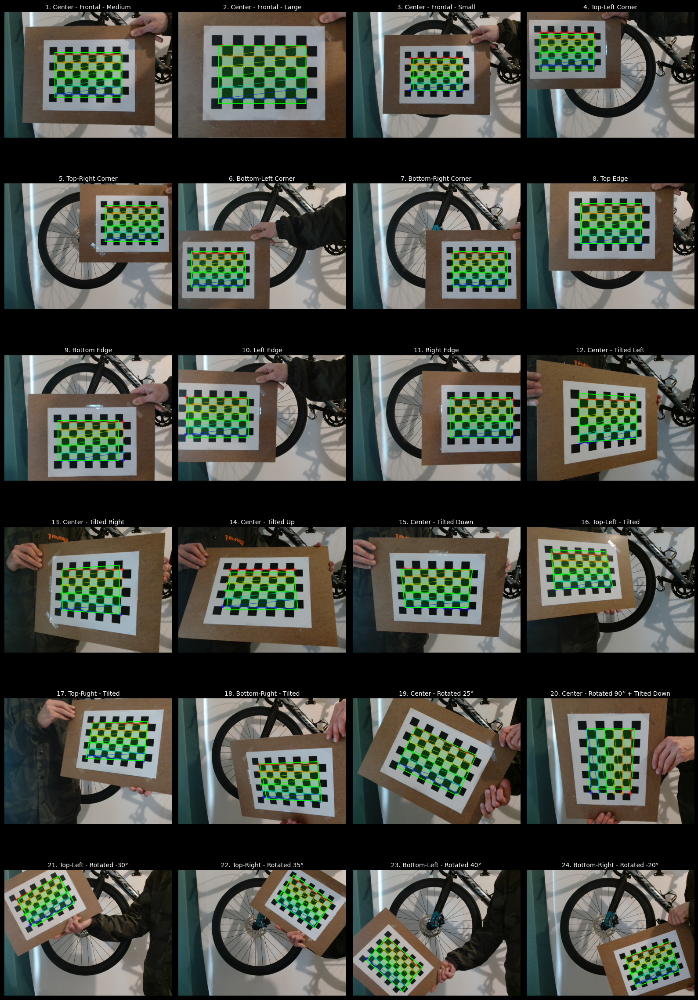


CAPTURED FRAMES SUMMARY
Total frames captured: 24
Image resolution: 640x480

✓ All 24 images saved to: calibration_frames_left
  Format: PNG
  Naming: frame_XX_[pose_description].png



In [219]:
# Display and save to directory (left)
display_captured_frames(left_captured_imgs, target_poses, save_dir='calibration_frames_left', 
                       show_target_guide=True, show_detected_board=True)

##### Visualize right camera frames

Saving images to: calibration_frames_right


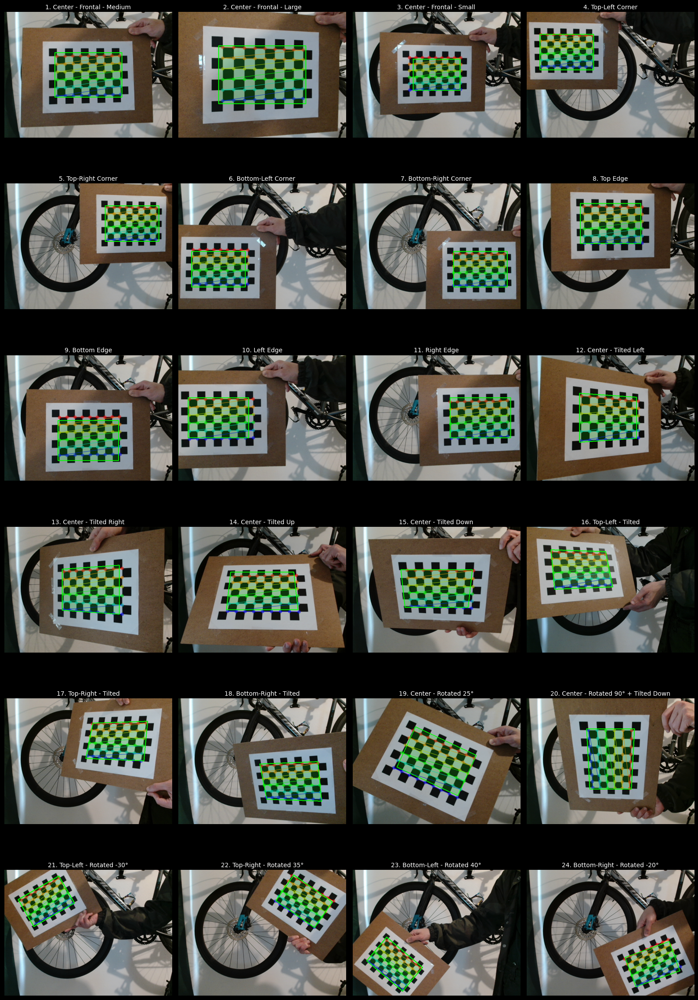


CAPTURED FRAMES SUMMARY
Total frames captured: 24
Image resolution: 640x480

✓ All 24 images saved to: calibration_frames_right
  Format: PNG
  Naming: frame_XX_[pose_description].png



In [226]:
# Display and save to directory (right)
display_captured_frames(right_captured_imgs, target_poses, save_dir='calibration_frames_right', 
                       show_target_guide=True, show_detected_board=True)

---
## 4. Monocular Camera Calibration

Perform calibration to estimate:
- **Intrinsic matrix (K)**: Focal lengths (fx, fy) and principal point (cx, cy)
- **Distortion coefficients (D)**: Radial (k1, k2, k3) and tangential (p1, p2) distortion

**Physics-Based Calibration**

Standard OpenCV calibration can produce unrealistic results. Our approach adds:
- **Focal length constraint**: fx ≈ fy (square pixels assumption)
- **Zero skew**: Axes perpendicular (typical CCD/CMOS sensors)

This prevents overfitting and produces more physically plausible parameters.

In [220]:
def calibrate_camera_mono(object_points, image_points, image_shape, use_physics_constraints=True):
    """
    Calibrate a single camera using captured chessboard images.
    
    Parameters:
    -----------
    object_points : list of numpy.ndarray
        3D object points in world coordinates for each image
    image_points : list of numpy.ndarray
        2D image points (detected corners) for each image
    image_shape : tuple
        (width, height) of the images
    use_physics_constraints : bool
        If True, enforces square pixels and zero tangential distortion
    
    Returns:
    --------
    dict : Calibration results containing K, D, rvecs, tvecs, and error metrics
    """
    print("\n" + "="*60)
    print("MONOCULAR CAMERA CALIBRATION")
    print("="*60)
    
    w, h = image_shape
    
    # Initial guess for intrinsic matrix
    # Assume focal length ≈ image width (typical for standard lenses)
    K_init = np.array([[w, 0, w/2],
                       [0, w, h/2],
                       [0, 0,   1]], dtype=np.float32)
    
    # Set calibration flags
    flags = 0
    if use_physics_constraints:
        flags |= cv2.CALIB_FIX_ASPECT_RATIO      # Force fx = fy (square pixels)
        flags |= cv2.CALIB_ZERO_TANGENT_DIST     # Assume p1 = p2 = 0
        flags |= cv2.CALIB_USE_INTRINSIC_GUESS   # Use K_init as starting point
        print("Using physics-based constraints:")
        print("  • Square pixels (fx = fy)")
        print("  • Zero tangential distortion (p1 = p2 = 0)")
    else:
        K_init = None
        print("Using unconstrained calibration")
    
    # Calibration criteria
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1e-5)
    
    print(f"\nCalibrating with {len(object_points)} images...")
    
    # Run calibration
    ret, K, D, rvecs, tvecs = cv2.calibrateCamera(
        object_points, image_points, (w, h), K_init, None, 
        flags=flags, criteria=criteria
    )
    
    # Calculate per-image errors
    errors = []
    for i in range(len(object_points)):
        imgpoints2, _ = cv2.projectPoints(object_points[i], rvecs[i], tvecs[i], K, D)
        error = cv2.norm(image_points[i], imgpoints2, cv2.NORM_L2) / len(imgpoints2)
        errors.append(error)
    
    # Print results
    print("\n" + "-"*60)
    print("CALIBRATION RESULTS")
    print("-"*60)
    print(f"Overall RMS reprojection error: {ret:.4f} pixels")
    print(f"Mean per-image error: {np.mean(errors):.4f} pixels")
    print(f"Std per-image error: {np.std(errors):.4f} pixels")
    print(f"Min/Max error: {np.min(errors):.4f} / {np.max(errors):.4f} pixels")
    
    print(f"\nIntrinsic Matrix (K):")
    print(f"  fx = {K[0,0]:.2f} pixels")
    print(f"  fy = {K[1,1]:.2f} pixels")
    print(f"  cx = {K[0,2]:.2f} pixels (image center: {w/2:.1f})")
    print(f"  cy = {K[1,2]:.2f} pixels (image center: {h/2:.1f})")
    
    print(f"\nDistortion Coefficients:")
    print(f"  k1 = {D[0,0]:.6f} (radial)")
    print(f"  k2 = {D[0,1]:.6f} (radial)")
    print(f"  p1 = {D[0,2]:.6f} (tangential)")
    print(f"  p2 = {D[0,3]:.6f} (tangential)")
    print(f"  k3 = {D[0,4]:.6f} (radial)")
    
    if use_physics_constraints:
        aspect_ratio = K[0,0] / K[1,1]
        print(f"\nAspect ratio (fx/fy): {aspect_ratio:.6f} (should be ~1.0)")
    
    print("="*60)
    
    return {
        'K': K,
        'D': D,
        'rvecs': rvecs,
        'tvecs': tvecs,
        'rms_error': ret,
        'per_image_errors': errors,
        'image_shape': (w, h)
    }

### 4.1 Left camera calibration

In [248]:
# Perform calibration on captured images
left_calib_results = calibrate_camera_mono(
    object_points=left_obj_pts,
    image_points=left_corners,
    image_shape=(width, height),
    use_physics_constraints=True
)

# Extract results for easy access
K_left = left_calib_results['K']
D_left = left_calib_results['D']


MONOCULAR CAMERA CALIBRATION
Using physics-based constraints:
  • Square pixels (fx = fy)
  • Zero tangential distortion (p1 = p2 = 0)

Calibrating with 24 images...

------------------------------------------------------------
CALIBRATION RESULTS
------------------------------------------------------------
Overall RMS reprojection error: 0.1350 pixels
Mean per-image error: 0.0179 pixels
Std per-image error: 0.0042 pixels
Min/Max error: 0.0113 / 0.0308 pixels

Intrinsic Matrix (K):
  fx = 634.69 pixels
  fy = 634.69 pixels
  cx = 349.75 pixels (image center: 320.0)
  cy = 236.06 pixels (image center: 240.0)

Distortion Coefficients:
  k1 = 0.079197 (radial)
  k2 = -0.351781 (radial)
  p1 = 0.000000 (tangential)
  p2 = 0.000000 (tangential)
  k3 = 0.550256 (radial)

Aspect ratio (fx/fy): 1.000000 (should be ~1.0)


### 4.2 Right camera calibration

In [249]:
# Perform calibration on captured images
right_calib_results = calibrate_camera_mono(
    object_points=right_obj_pts,
    image_points=right_corners,
    image_shape=(width, height),
    use_physics_constraints=True
)

# Extract results for easy access
K_right = right_calib_results['K']
D_right = right_calib_results['D']


MONOCULAR CAMERA CALIBRATION
Using physics-based constraints:
  • Square pixels (fx = fy)
  • Zero tangential distortion (p1 = p2 = 0)

Calibrating with 24 images...

------------------------------------------------------------
CALIBRATION RESULTS
------------------------------------------------------------
Overall RMS reprojection error: 0.1450 pixels
Mean per-image error: 0.0194 pixels
Std per-image error: 0.0036 pixels
Min/Max error: 0.0133 / 0.0273 pixels

Intrinsic Matrix (K):
  fx = 630.82 pixels
  fy = 630.82 pixels
  cx = 339.41 pixels (image center: 320.0)
  cy = 235.24 pixels (image center: 240.0)

Distortion Coefficients:
  k1 = 0.067499 (radial)
  k2 = -0.354589 (radial)
  p1 = 0.000000 (tangential)
  p2 = 0.000000 (tangential)
  k3 = 0.627980 (radial)

Aspect ratio (fx/fy): 1.000000 (should be ~1.0)


### 4.3 Visualize Calibration Quality

In [260]:
def visualize_calibration_quality(calib_results, target_poses):
    """
    Visualize calibration quality with error plots and statistics.
    """
    errors = calib_results['per_image_errors']
    
    # Create figure with dark background
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    
    # Plot 1: Per-image reprojection errors
    ax = axes[0]
    x = np.arange(len(errors))
    colors = ['lime' if e < 0.5 else 'orange' if e < 1.0 else 'red' for e in errors]
    ax.bar(x, errors, color=colors, alpha=0.7, edgecolor='gray')
    ax.axhline(y=calib_results['rms_error'], color='cyan', linestyle='--', 
               label=f'RMS Error: {calib_results["rms_error"]:.3f}px')
    ax.axhline(y=np.mean(errors), color='magenta', linestyle=':', 
               label=f'Mean: {np.mean(errors):.3f}px', linewidth=2)
    ax.set_xlabel('Image Index', fontsize=12)
    ax.set_ylabel('Reprojection Error (pixels)', fontsize=12)
    ax.set_title('Per-Image Calibration Error', fontsize=14, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Add threshold lines
    ax.axhline(y=0.5, color='lime', linestyle=':', alpha=0.5, linewidth=2)
    ax.axhline(y=1.0, color='orange', linestyle=':', alpha=0.5, linewidth=2)
    ax.text(len(errors)*0.98, 0.5, 'Good', ha='right', va='bottom', color='lime', fontsize=12)
    ax.text(len(errors)*0.98, 1.0, 'Acceptable', ha='right', va='bottom', color='orange', fontsize=12)
    
    # Plot 2: Error distribution histogram
    ax = axes[1]
    ax.hist(errors, bins=15, edgecolor='gray', alpha=0.7, color='steelblue')
    ax.axvline(x=calib_results['rms_error'], color='cyan', linestyle='--', 
               label=f'RMS: {calib_results["rms_error"]:.3f}px', linewidth=2)
    ax.axvline(x=np.mean(errors), color='magenta', linestyle=':', 
               label=f'Mean: {np.mean(errors):.3f}px', linewidth=2)
    ax.set_xlabel('Reprojection Error (pixels)', fontsize=12)
    ax.set_ylabel('Number of Images', fontsize=12)
    ax.set_title('Error Distribution', fontsize=14, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.show()
    
    # Print quality assessment
    print("\n" + "="*60)
    print("CALIBRATION QUALITY ASSESSMENT")
    print("="*60)
    
    good_count = sum(1 for e in errors if e < 0.5)
    acceptable_count = sum(1 for e in errors if 0.5 <= e < 1.0)
    poor_count = sum(1 for e in errors if e >= 1.0)
    
    print(f"Images with error < 0.5px (Good): {good_count}/{len(errors)} ({100*good_count/len(errors):.1f}%)")
    print(f"Images with error 0.5-1.0px (Acceptable): {acceptable_count}/{len(errors)} ({100*acceptable_count/len(errors):.1f}%)")
    print(f"Images with error > 1.0px (Poor): {poor_count}/{len(errors)} ({100*poor_count/len(errors):.1f}%)")
    
    if poor_count > 0:
        print(f"\nWarning: {poor_count} images have high reprojection error.")
        print("Consider removing these images and recalibrating:")
        for i, e in enumerate(errors):
            if e >= 1.0:
                print(f"  • Image {i+1}: {target_poses[i]['description']} ({e:.3f}px)")
    
    if calib_results['rms_error'] < 0.5:
        print("\nExcellent calibration quality!")
    elif calib_results['rms_error'] < 1.0:
        print("\nGood calibration quality.")
    else:
        print("\nCalibration quality could be improved.")
    
    print("="*60)

##### Left camera calib results

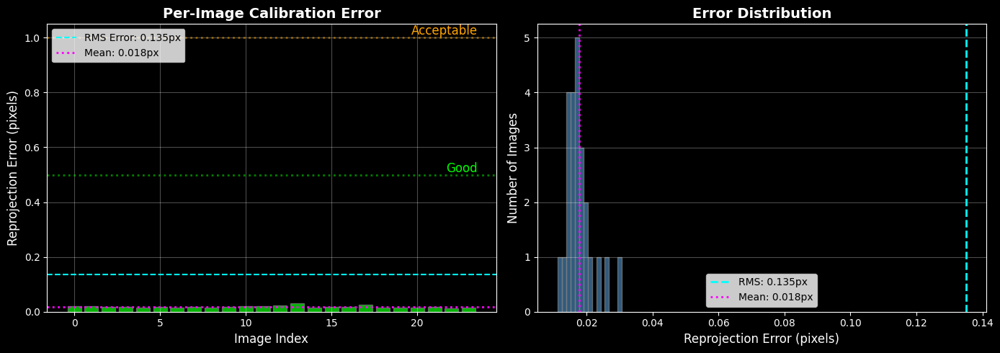


CALIBRATION QUALITY ASSESSMENT
Images with error < 0.5px (Good): 24/24 (100.0%)
Images with error 0.5-1.0px (Acceptable): 0/24 (0.0%)
Images with error > 1.0px (Poor): 0/24 (0.0%)

Excellent calibration quality!


In [261]:
# Visualize results
visualize_calibration_quality(left_calib_results, target_poses)

##### Right camera calib results

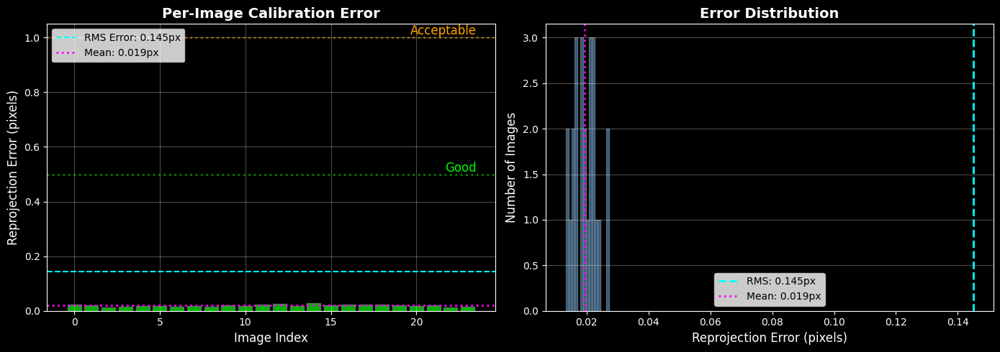


CALIBRATION QUALITY ASSESSMENT
Images with error < 0.5px (Good): 24/24 (100.0%)
Images with error 0.5-1.0px (Acceptable): 0/24 (0.0%)
Images with error > 1.0px (Poor): 0/24 (0.0%)

Excellent calibration quality!


In [262]:
# Visualize results
visualize_calibration_quality(right_calib_results, target_poses)

### 4.4 Visualize Undistortion Effect

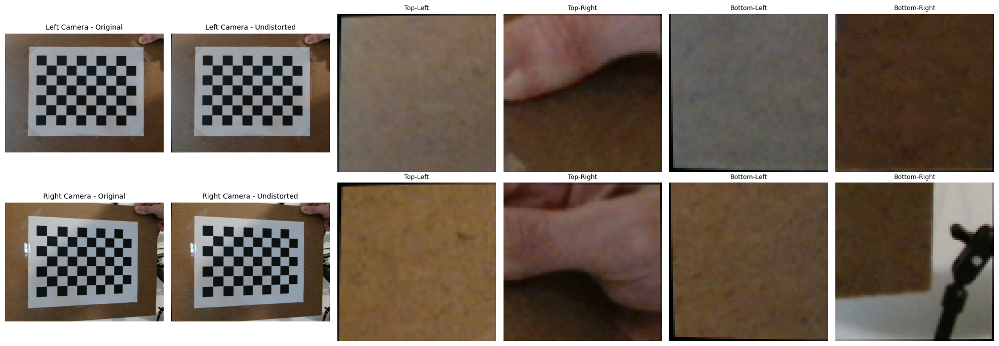

Undistortion Comparison Summary:
  • Original vs Undistorted: Check edge straightening
  • Corner Crops: Highlight where distortion is most visible
  • Black borders at corners: Result of alpha=1 (keeping all pixels)
  • Compare both cameras: Verify similar distortion characteristics


In [268]:
def visualize_undistortion(left_images, right_images, K_left, D_left, K_right, D_right, crop_size=80):
    """
    Compare undistortion between left and right cameras.
    Shows original, undistorted, and corner crops for both cameras.
    """
    # Use first image from each camera
    cameras = [
        (left_images[1], K_left, D_left, "Left Camera"),
        (right_images[1], K_right, D_right, "Right Camera")
    ]
    
    fig, axes = plt.subplots(2, 6, figsize=(20, 7))
    
    for cam_idx, (img, K, D, cam_name) in enumerate(cameras):
        h, w = img.shape[:2]
        
        # Get optimal new camera matrix (alpha=1 keeps all pixels)
        newK, roi = cv2.getOptimalNewCameraMatrix(K, D, (w, h), 1, (w, h))
        
        # Undistort
        undistorted = cv2.undistort(img, K, D, None, newK)
        
        # Convert to RGB
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        undist_rgb = cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB)
        
        # Column 0: Original
        axes[cam_idx, 0].imshow(img_rgb)
        axes[cam_idx, 0].set_title(f'{cam_name} - Original', fontsize=10)
        axes[cam_idx, 0].axis('off')
        
        # Column 1: Undistorted
        axes[cam_idx, 1].imshow(undist_rgb)
        axes[cam_idx, 1].set_title(f'{cam_name} - Undistorted', fontsize=10)
        axes[cam_idx, 1].axis('off')
        
        # Columns 2-5: Corner crops from undistorted image
        corners = [
            ("Top-Left", 0, 0),
            ("Top-Right", 0, w - crop_size),
            ("Bottom-Left", h - crop_size, 0),
            ("Bottom-Right", h - crop_size, w - crop_size)
        ]
        
        for col_idx, (corner_name, y, x) in enumerate(corners, start=2):
            crop = undist_rgb[y:y+crop_size, x:x+crop_size]
            axes[cam_idx, col_idx].imshow(crop)
            axes[cam_idx, col_idx].set_title(f'{corner_name}', fontsize=9)
            axes[cam_idx, col_idx].axis('off')
            # Highlight corner crops with colored border
            for spine in axes[cam_idx, col_idx].spines.values():
                spine.set_edgecolor('cyan')
                spine.set_linewidth(2)
                spine.set_visible(True)
    
    plt.tight_layout()
    plt.show()
    
    print("Undistortion Comparison Summary:")
    print("  • Original vs Undistorted: Check edge straightening")
    print("  • Corner Crops: Highlight where distortion is most visible")
    print("  • Black borders at corners: Result of alpha=1 (keeping all pixels)")
    print("  • Compare both cameras: Verify similar distortion characteristics")

# Show undistortion comparison for both cameras
visualize_undistortion(left_captured_imgs, right_captured_imgs, 
                      K_left, D_left, K_right, D_right, crop_size=80)

#### Save Calibration Parameters

In [270]:
# Save calibration results for left and right cameras
left_save_filename = 'left_camera_params.npz'
np.savez(left_save_filename, 
         K=K_left, 
         D=D_left, 
         image_shape=left_calib_results['image_shape'])

right_save_filename = 'right_camera_params.npz'
np.savez(right_save_filename, 
         K=K_right, 
         D=D_right, 
         image_shape=right_calib_results['image_shape'])

print(f"Calibration parameters saved to: {left_save_filename} and {right_save_filename}")
print("\nSaved data:")
print("  • K: Intrinsic matrix (3x3)")
print("  • D: Distortion coefficients (1x5)")
print("  • image_shape: (width, height)")

Calibration parameters saved to: left_camera_params.npz and right_camera_params.npz

Saved data:
  • K: Intrinsic matrix (3x3)
  • D: Distortion coefficients (1x5)
  • image_shape: (width, height)


---
## 5. Stereo Calibration

Now that we have calibrated both cameras individually, we need to find the **relative pose** (rotation R and translation T) between them. This is essential for stereo vision applications like 3D reconstruction and depth estimation.

### Strategy:
1. **Initial Estimate**: Capture a single paired image with the chessboard visible to both cameras simultaneously
2. **Compute Baseline**: Estimate the initial stereo parameters (R, T, baseline distance)
3. **Refinement Dataset**: Capture 10-15 paired images at various positions
4. **Refined Calibration**: Improve accuracy using multiple paired views
5. **Rectification**: Transform images so corresponding points lie on the same horizontal scanlines

### Stereo Calibration Output Explained

- **R (3×3)**: Rotation matrix from right to left camera frame
- **T (3×1)**: Translation vector from right to left camera (units: same as calibration pattern)
- **E (3×3)**: Essential matrix (encodes R and T, used in 5-point algorithm)
- **F (3×3)**: Fundamental matrix (relates pixel correspondences via epipolar geometry)
- **Baseline**: Euclidean distance between camera centers (||T||)

**Key Insight**: After stereo calibration, R should be close to Identity (cameras roughly parallel).
The rectification step will split this rotation between both cameras to make them exactly parallel.

### 5.1 Capture Initial Stereo Pair

Capture a single frame from both cameras simultaneously with the chessboard visible in both views.

In [69]:
def capture_stereo_pair(cam_left_idx, cam_right_idx, pattern_size, square_size_mm):
    """Capture simultaneous frames from both cameras with chessboard visible."""
    
    # Initialize video capture for both cameras using DirectShow backend (Windows)
    cap_left = cv2.VideoCapture(cam_left_idx, cv2.CAP_DSHOW)
    cap_right = cv2.VideoCapture(cam_right_idx, cv2.CAP_DSHOW)
    
    # Configure both cameras with identical settings for synchronized capture
    for cap in [cap_left, cap_right]:
        cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)      # Set resolution width
        cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)     # Set resolution height
        cap.set(cv2.CAP_PROP_AUTOFOCUS, 0)          # Disable autofocus for stability
    
    # Display instructions to user
    print("Position chessboard visible in BOTH cameras")
    print("Press SPACE when both detect the board | ESC to cancel")
    
    # Generate 3D object points for the chessboard pattern
    # Creates points at z=0 plane with coordinates in mm
    obj_pts = np.zeros((pattern_size[0] * pattern_size[1], 3), np.float32)
    obj_pts[:, :2] = np.mgrid[0:pattern_size[0], 0:pattern_size[1]].T.reshape(-1, 2)
    obj_pts *= square_size_mm  # Scale grid to actual square size
    
    # Main capture loop
    while True:
        # Read frames from both cameras
        ret_l, frame_l = cap_left.read()
        ret_r, frame_r = cap_right.read()
        
        # Exit if either camera fails to read
        if not ret_l or not ret_r:
            break
        
        # Convert frames to grayscale for corner detection
        gray_l = cv2.cvtColor(frame_l, cv2.COLOR_BGR2GRAY)
        gray_r = cv2.cvtColor(frame_r, cv2.COLOR_BGR2GRAY)
        
        # Detect chessboard corners in both cameras
        # FAST_CHECK flag speeds up detection but may miss some boards
        found_l, corners_l = cv2.findChessboardCorners(gray_l, pattern_size, cv2.CALIB_CB_FAST_CHECK)
        found_r, corners_r = cv2.findChessboardCorners(gray_r, pattern_size, cv2.CALIB_CB_FAST_CHECK)
        
        # Create display copies of frames
        display_l, display_r = frame_l.copy(), frame_r.copy()
        
        # Draw detected corners on frames for visual feedback
        if found_l:
            cv2.drawChessboardCorners(display_l, pattern_size, corners_l, True)
        if found_r:
            cv2.drawChessboardCorners(display_r, pattern_size, corners_r, True)
        
        # Create side-by-side display of both camera views
        display = np.hstack([display_l, display_r])
        
        # Show status message based on detection state
        status = "BOTH DETECTED - SPACE to capture" if (found_l and found_r) else "Adjust position"
        color = (0, 255, 0) if (found_l and found_r) else (0, 0, 255)  # Green if ready, red otherwise
        cv2.putText(display, status, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 6)
        cv2.putText(display, status, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        cv2.imshow('Stereo Capture', display)
        
        # Handle keyboard input
        key = cv2.waitKey(1) & 0xFF
        
        # SPACE key: Capture if both boards detected
        if key == ord(' ') and found_l and found_r:
            # Refine corner positions to sub-pixel accuracy
            # Uses 11x11 search window with termination criteria
            criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
            corners_l = cv2.cornerSubPix(gray_l, corners_l, (11, 11), (-1, -1), criteria)
            corners_r = cv2.cornerSubPix(gray_r, corners_r, (11, 11), (-1, -1), criteria)
            
            # Clean up resources
            cap_left.release()
            cap_right.release()
            cv2.destroyAllWindows()
            
            print("Stereo pair captured!")
            return frame_l, frame_r, corners_l, corners_r, obj_pts
        
        # ESC key: Cancel capture
        elif key == 27:
            break
    
    # Clean up if loop exited without capture
    cap_left.release()
    cap_right.release()
    cv2.destroyAllWindows()
    return None, None, None, None, None

#### Capture Initial Pair
* **Important Note:** measure the square size in mm and update
![Measure square in mm](./figures/square_meas.jpg)

Position chessboard visible in BOTH cameras
Press SPACE when both detect the board | ESC to cancel
Stereo pair captured!


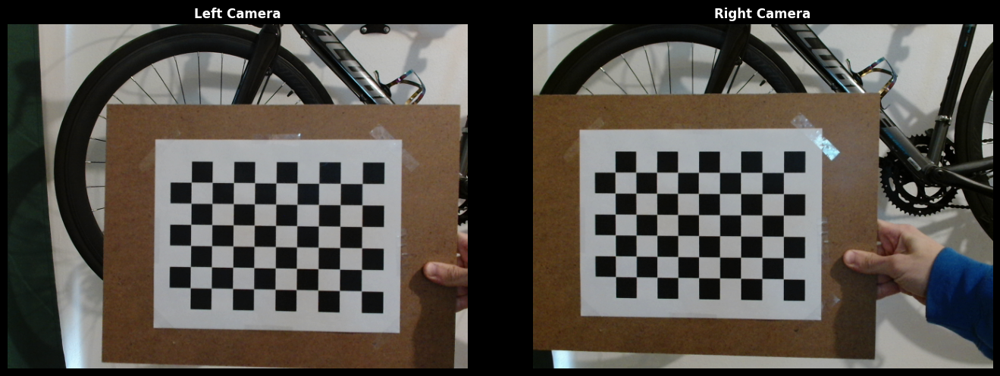

Detected 54 corners in each camera


In [145]:
# UPDATE SQUARE SIZE in MM for accurate object points
SQUARE_SIZE_MM = 24.4
# Capture initial stereo pair
pattern_size = (PATTERN_SQUARES_X, PATTERN_SQUARES_Y)
init_left, init_right, init_corners_l, init_corners_r, init_obj_pts = capture_stereo_pair(
    cam_left_idx, cam_right_idx, pattern_size, SQUARE_SIZE_MM
)

if init_left is not None:
    # Create figure with dark background
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        
    axes[0].imshow(cv2.cvtColor(init_left, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Left Camera', fontweight='bold')
    axes[0].axis('off')
    axes[1].imshow(cv2.cvtColor(init_right, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Right Camera', fontweight='bold')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()
    print(f"Detected {len(init_corners_l)} corners in each camera")

### 5.2 Initial Stereo Calibration

##### What is Stereo Rectification?

**Goal**: Transform both images so their epipolar lines become horizontal and aligned.

**Why?**: Makes stereo matching trivial - corresponding points lie on the same row (y-coordinate).

**How**: Apply a rotation (R1, R2) to each camera virtually, then reproject with new matrices (P1, P2).

**Key Outputs**:
- **R1, R2**: Rotation matrices applied to left and right cameras
  - Splits the relative rotation R approximately evenly between cameras
  - Maximizes overlap between rectified views
- **P1, P2**: New projection matrices (3×4)
  - First 3×3 = new intrinsic matrix K'
  - Last column encodes new camera position
- **Q (4×4)**: Disparity-to-depth reprojection matrix
  - Used to convert disparity maps to 3D point clouds
  - Formula: Z = focal_length × baseline / disparity

**Alpha Parameter**:
- `alpha=0`: Crop to valid pixels only (no black regions)
- `alpha=1`: Keep all pixels (includes black borders from remapping)
- `alpha=0.5`: Balance between the two

**Validation**: After rectification:
- Corresponding points should have **identical Y-coordinates**
- Vertical offset < 1.0px indicates good rectification
- Epipolar lines are horizontal and parallel

In [146]:
def calibrate_stereo_initial(obj_pts, left_corners, right_corners, K_left, D_left, K_right, D_right, image_shape):
    """Estimate stereo parameters from paired captures. Uses fixed intrinsics."""
    
    # Fix intrinsic parameters (K and D) - only solve for stereo relationship (R, T, E, F)
    # This assumes monocular calibrations are accurate and shouldn't be changed
    flags = cv2.CALIB_FIX_INTRINSIC
    
    # Termination criteria: stop when change < 1e-5 OR after 100 iterations
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1e-5)
    
    print(f"Running stereo calibration with {len(obj_pts)} pair(s)...")
    
    # Perform stereo calibration
    # Returns: RMS error, intrinsics (unchanged due to CALIB_FIX_INTRINSIC), R, T, E, F
    # R: Rotation matrix from left to right camera frame (R_l2r)
    # T: Translation vector from left to right camera (position of right in left frame)
    # E: Essential matrix (geometric relationship without intrinsics)
    # F: Fundamental matrix (geometric relationship in pixel coordinates)
    ret, K_l, D_l, K_r, D_r, R, T, E, F = cv2.stereoCalibrate(
        obj_pts,              # 3D object points (same for both cameras)
        left_corners,         # 2D detected corners in left camera
        right_corners,        # 2D detected corners in right camera
        K_left.copy(),        # Left camera intrinsic matrix (fixed)
        D_left.copy(),        # Left camera distortion coefficients (fixed)
        K_right.copy(),       # Right camera intrinsic matrix (fixed)
        D_right.copy(),       # Right camera distortion coefficients (fixed)
        image_shape,          # Image dimensions (width, height)
        criteria=criteria,    # Convergence criteria
        flags=flags           # Calibration flags
    )
    
    # Calculate baseline distance (physical separation between cameras)
    # ||T|| gives the Euclidean distance from left to right camera center
    baseline = np.linalg.norm(T)
    
    # Convert rotation matrix to axis-angle representation, then to degrees
    # This gives intuitive X, Y, Z rotation angles showing camera alignment
    rotation_angles = cv2.Rodrigues(R)[0].flatten() * 180 / np.pi
    
    # Display calibration results
    print(f"Stereo calibration complete!")
    print(f"RMS: {ret:.4f} px | Baseline: {baseline:.2f} mm")
    print(f"Rotation (deg): X={rotation_angles[0]:.2f}° Y={rotation_angles[1]:.2f}° Z={rotation_angles[2]:.2f}°")
    
    # Return all stereo parameters in a dictionary
    return {
        'R': R,                          # Rotation from left to right camera
        'T': T,                          # Translation from left to right camera
        'E': E,                          # Essential matrix
        'F': F,                          # Fundamental matrix
        'baseline_mm': baseline,         # Distance between cameras (mm)
        'rotation_deg': rotation_angles, # Relative rotation in degrees
        'rms_error': ret,                # Reprojection error (pixels)
        'num_images': len(obj_pts)       # Number of image pairs used
    }

#### Load monocular calibration params and compute initial setup

In [147]:
# Load saved calibration parameters
left_calib_params = np.load('left_camera_params.npz')
K_left = left_calib_params['K']
D_left = left_calib_params['D']
width, height = left_calib_params['image_shape']
right_calib_params = np.load('right_camera_params.npz')
K_right = right_calib_params['K']
D_right = right_calib_params['D']

# Compute initial stereo calibration
if init_left is not None:
    stereo_init = calibrate_stereo_initial(
        [init_obj_pts], [init_corners_l], [init_corners_r],
        K_left, D_left, K_right, D_right, (width, height)
    )
    print(f"\nInitial Stereo Geometry:")
    print(f"Baseline: {stereo_init['baseline_mm']:.2f} mm")
    print(f"RMS Error: {stereo_init['rms_error']:.4f} pixels")

Running stereo calibration with 1 pair(s)...
Stereo calibration complete!
RMS: 0.1481 px | Baseline: 114.78 mm
Rotation (deg): X=0.85° Y=0.58° Z=-0.32°

Initial Stereo Geometry:
Baseline: 114.78 mm
RMS Error: 0.1481 pixels


#### You can verify that the estimation is close to optimal by measuring the distance between the lense centers
![Baseline measurment](./figures/baseline_meas.jpg)

### 5.3 Capture Stereo Refinement Dataset

####  Stereo Pose Generation Function

In [150]:
def generate_stereo_poses_from_left(pattern_size, square_size_mm, image_size, 
                                     K_left, D_left, K_right, D_right, 
                                     R_stereo, T_stereo, num_poses=20):
    """
    Generate target poses using LEFT camera as reference.
    Projects poses to right camera using stereo transformation.
    """
    width, height = image_size
    pattern_w, pattern_h = pattern_size
    
    # Create 3D object points (pattern in its own coordinate system)
    obj_pts = np.zeros((pattern_w * pattern_h, 3), np.float32)
    obj_pts[:, :2] = np.mgrid[0:pattern_w, 0:pattern_h].T.reshape(-1, 2)
    obj_pts *= square_size_mm
    
    # Center the pattern
    center_offset = np.array([pattern_w * square_size_mm / 2, 
                              pattern_h * square_size_mm / 2, 0])
    obj_pts -= center_offset
    
    poses = []
    
    # Average focal length for distance calculation
    f_avg = (K_left[0, 0] + K_left[1, 1]) / 2
    
    # Base distance - pattern fills ~50% of frame
    base_distance = (pattern_w * square_size_mm * f_avg) / (0.5 * width)
    
    # Calculate stereo baseline
    baseline_mm = np.linalg.norm(T_stereo)
    
    # Shift center rightward in left camera to keep pattern visible in both
    # At distance Z, baseline creates offset of approximately (baseline * f / Z) pixels
    center_shift_x = (baseline_mm * f_avg) / base_distance * 0.5
    
    print(f"Stereo geometry:")
    print(f"Baseline: {baseline_mm:.1f}mm")
    print(f"Base distance: {base_distance:.1f}mm")
    print(f"Center shift: {center_shift_x:.1f}px\n")
    
    # Pose configurations for LEFT camera (reduced diversity for stereo)
    # Note: Generic numbering used as actual positions vary due to stereo constraints
    configs = [
        # Different distances
        (-0.35, 0, 1.0, 0, 0, 0),
        (-0.35, 0, 1.2, 0, 0, 0),
        (-0.35, 0, 1.5, 0, 0, 0),
        (-0.35, 0, 1.8, 0, 0, 0),
        # Positions (small offsets)
        (-0.8, -0.55, 1.5, 0, 0, 0),
        (-0.8, 0.75, 1.5, 0, 0, 0),
        (0.05, -0.35, 1.0, 0, 0, 0),
        (0.05, 0.55, 1.0, 0, 0, 0),
        # Tilts (moderate angles)
        (0, 0, 1.2, 0, -0.25, 0),
        (-0.55, 0, 1.2, 0, 0.25, 0),
        (0, 0, 1.2, -0.25, 0, 0),
        (0, 0, 1.2, 0.25, 0, 0),
        # Rotations
        (0, 0, 1.3, 0, 0, 0.22),
        (0, 0, 1.3, 0, 0, -0.22),
        # Combined
        (-0.55, -0.12, 1.3, -0.2, -0.2, 0),
        (0.1, -0.12, 1.3, -0.2, 0.2, 0),
    ]
    
    for pose_idx, (offset_x, offset_y, dist_scale, rot_x, rot_y, rot_z) in enumerate(configs[:num_poses], 1):
        desc = f"Pose {pose_idx}"
        
        # Generate pose in LEFT camera frame
        x_offset = (offset_x * width * 0.35) + center_shift_x
        y_offset = offset_y * height * 0.35
        distance = base_distance * dist_scale
        
        tvec_left = np.array([[x_offset], [y_offset], [distance]], dtype=np.float64)
        rvec_left = np.array([[rot_x], [rot_y], [rot_z]], dtype=np.float64)
        
        # Project to left camera
        corners_left, _ = cv2.projectPoints(obj_pts, rvec_left, tvec_left, K_left, D_left)
        corners_left = corners_left.reshape(-1, 2)
        
        # Transform pose to right camera frame
        R_mat_left, _ = cv2.Rodrigues(rvec_left)
        R_right = R_stereo @ R_mat_left
        rvec_right, _ = cv2.Rodrigues(R_right)
        rvec_right = rvec_right.reshape(3, 1)
        tvec_right = (R_stereo @ tvec_left + T_stereo.reshape(3, 1)).astype(np.float64)
        
        # Project to right camera
        corners_right, _ = cv2.projectPoints(obj_pts, rvec_right, tvec_right, K_right, D_right)
        corners_right = corners_right.reshape(-1, 2)
        
        # Check if both projections are within frame bounds
        margin = 25
        left_valid = (np.all(corners_left[:, 0] >= margin) and 
                      np.all(corners_left[:, 1] >= margin) and 
                      np.all(corners_left[:, 0] < width - margin) and 
                      np.all(corners_left[:, 1] < height - margin))
        right_valid = (np.all(corners_right[:, 0] >= margin) and 
                       np.all(corners_right[:, 1] >= margin) and 
                       np.all(corners_right[:, 0] < width - margin) and 
                       np.all(corners_right[:, 1] < height - margin))
        
        if left_valid and right_valid:
            poses.append({
                'description': desc,
                'corners_left': corners_left,
                'corners_right': corners_right,
                'obj_pts': obj_pts + center_offset,
                'rvec_left': rvec_left,
                'tvec_left': tvec_left,
                'rvec_right': rvec_right,
                'tvec_right': tvec_right
            })
            print(f"{desc}")
    
    print(f"\nGenerated {len(poses)} valid stereo poses (left camera reference)")
    return poses

# Generate poses with left as reference
stereo_target_poses = generate_stereo_poses_from_left(
    pattern_size=(PATTERN_SQUARES_X, PATTERN_SQUARES_Y),
    square_size_mm=SQUARE_SIZE_MM,
    image_size=(width, height),
    K_left=K_left, D_left=D_left,
    K_right=K_right, D_right=D_right,
    R_stereo=stereo_init['R'],
    T_stereo=stereo_init['T'],
    num_poses=20
)


Stereo geometry:
Baseline: 114.8mm
Base distance: 435.6mm
Center shift: 83.6px

Pose 1
Pose 2
Pose 3
Pose 4
Pose 5
Pose 6
Pose 7
Pose 8
Pose 9
Pose 10
Pose 11
Pose 12
Pose 13
Pose 14
Pose 15
Pose 16

Generated 16 valid stereo poses (left camera reference)


#### Visualize Stereo Poses

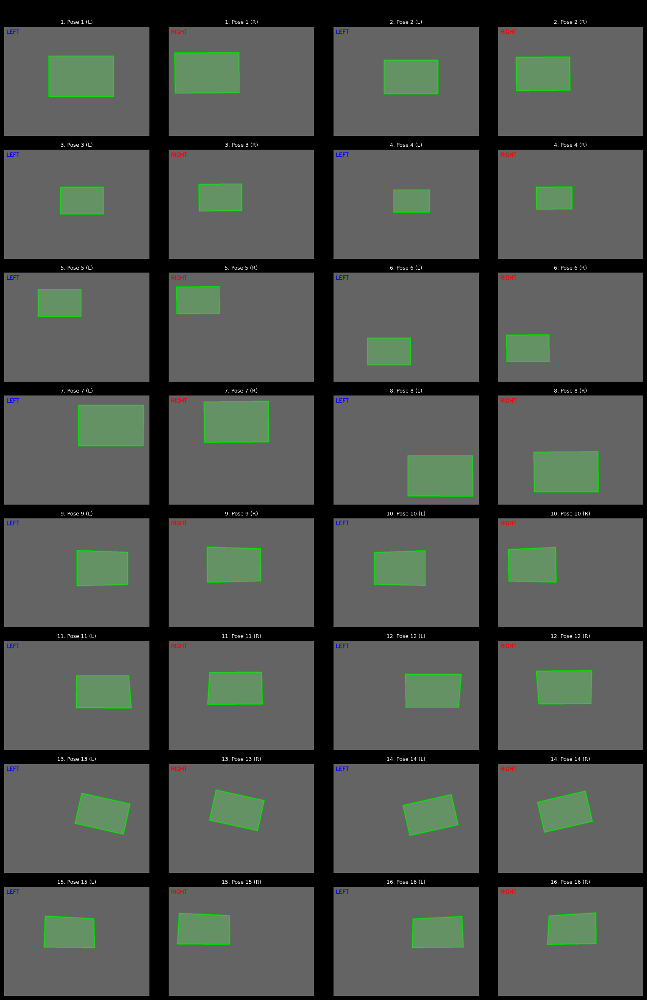

In [151]:
def visualize_stereo_target_poses(poses, img_width=640, img_height=480):
    """
    Visualize all stereo target poses in a grid layout.
    Each row shows left and right camera views for a single pose.
    This helps preview all required positions for stereo capture.
    """
    num_poses = len(poses)
    cols = 4  # 2 poses per row (each pose = left + right view)
    rows = (num_poses * 2 + cols - 1) // cols  # *2 because each pose needs 2 subplots
    
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(rows, cols, figsize=(16, 3*rows))
        axes = axes.flatten()
    
    subplot_idx = 0
    for pose_idx, pose in enumerate(poses):
        # --- LEFT CAMERA VIEW ---
        img_left = np.ones((img_height, img_width, 3), dtype=np.uint8) * 100
        
        # Draw target quadrilateral for left camera
        corners_left = pose['corners_left'].astype(np.int32)
        quad_left = np.array([
            corners_left[0],                                    # Top-left corner
            corners_left[8],                                    # Top-right corner (9th corner for 9x6 pattern)
            corners_left[-1],                                   # Bottom-right corner
            corners_left[-9]                                    # Bottom-left corner
        ]).reshape((-1, 1, 2))
        
        cv2.polylines(img_left, [quad_left], True, (0, 200, 0), 3)
        
        # Fill with semi-transparent green
        overlay_left = img_left.copy()
        cv2.fillPoly(overlay_left, [quad_left], (100, 255, 100))
        cv2.addWeighted(overlay_left, 0.3, img_left, 0.7, 0, img_left)
        
        # Add "LEFT" label
        cv2.putText(img_left, "LEFT", (10, 30), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 0, 0), 2)
        
        # Display left camera view
        axes[subplot_idx].imshow(cv2.cvtColor(img_left, cv2.COLOR_BGR2RGB))
        axes[subplot_idx].set_title(f"{pose_idx+1}. {pose['description']} (L)", fontsize=9)
        axes[subplot_idx].axis('off')
        subplot_idx += 1
        
        # --- RIGHT CAMERA VIEW ---
        img_right = np.ones((img_height, img_width, 3), dtype=np.uint8) * 100
        
        # Draw target quadrilateral for right camera
        corners_right = pose['corners_right'].astype(np.int32)
        quad_right = np.array([
            corners_right[0],
            corners_right[8],
            corners_right[-1],
            corners_right[-9]
        ]).reshape((-1, 1, 2))
        
        cv2.polylines(img_right, [quad_right], True, (0, 200, 0), 3)
        
        # Fill with semi-transparent green
        overlay_right = img_right.copy()
        cv2.fillPoly(overlay_right, [quad_right], (100, 255, 100))
        cv2.addWeighted(overlay_right, 0.3, img_right, 0.7, 0, img_right)
        
        # Add "RIGHT" label
        cv2.putText(img_right, "RIGHT", (10, 30), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)
        
        # Display right camera view
        axes[subplot_idx].imshow(cv2.cvtColor(img_right, cv2.COLOR_BGR2RGB))
        axes[subplot_idx].set_title(f"{pose_idx+1}. {pose['description']} (R)", fontsize=9)
        axes[subplot_idx].axis('off')
        subplot_idx += 1
    
    # Hide unused subplots
    for idx in range(subplot_idx, len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle(f'Stereo Target Poses Preview ({len(poses)} poses)', 
                 fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

# Visualize the stereo target poses
if len(stereo_target_poses) > 0:
    visualize_stereo_target_poses(stereo_target_poses, width, height)

####  Guided Stereo Capture Function

In [152]:
def guided_stereo_calibration_capture(cam_left_idx, cam_right_idx, stereo_target_poses, pattern_size,
                                      auto_capture=True, alignment_threshold=0.80, 
                                      focus_threshold=80.0, stability_frames=5):
    """
    Guided stereo calibration with automatic capture using alignment metrics.
    Synchronizes both cameras and checks alignment for both simultaneously.
    """
    cap_left = cv2.VideoCapture(cam_left_idx, cv2.CAP_DSHOW)
    cap_right = cv2.VideoCapture(cam_right_idx, cv2.CAP_DSHOW)
    
    for cap in [cap_left, cap_right]:
        cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
        cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
        cap.set(cv2.CAP_PROP_AUTOFOCUS, 0)
    
    captured_left, captured_right = [], []
    captured_corners_left, captured_corners_right = [], []
    captured_obj_pts = []
    
    current_pose_idx = 0
    stable_count = 0
    prev_corners_left, prev_corners_right = None, None
    
    print(f"Guided Stereo Calibration Capture")
    print(f"Total poses: {len(stereo_target_poses)}")
    print(f"Auto-capture: {'ON' if auto_capture else 'OFF'}")
    print(f"Press SPACE to capture manually | ESC to finish\n")
    
    while current_pose_idx < len(stereo_target_poses):
        ret_l, frame_l = cap_left.read()
        ret_r, frame_r = cap_right.read()
        
        if not ret_l or not ret_r:
            break
        
        target_pose = stereo_target_poses[current_pose_idx]
        target_corners_l = target_pose['corners_left']
        target_corners_r = target_pose['corners_right']
        
        # Extract target quads (4 corners)
        corners_l_2d = target_corners_l
        corners_r_2d = target_corners_r
        target_quad_l = np.array([corners_l_2d[0], corners_l_2d[pattern_size[0]-1], 
                                   corners_l_2d[-1], corners_l_2d[-pattern_size[0]]])
        target_quad_r = np.array([corners_r_2d[0], corners_r_2d[pattern_size[0]-1], 
                                   corners_r_2d[-1], corners_r_2d[-pattern_size[0]]])
        
        # Detect chessboard
        gray_l = cv2.cvtColor(frame_l, cv2.COLOR_BGR2GRAY)
        gray_r = cv2.cvtColor(frame_r, cv2.COLOR_BGR2GRAY)
        
        found_l, detected_l = cv2.findChessboardCorners(gray_l, pattern_size, cv2.CALIB_CB_FAST_CHECK)
        found_r, detected_r = cv2.findChessboardCorners(gray_r, pattern_size, cv2.CALIB_CB_FAST_CHECK)
        
        display_l, display_r = frame_l.copy(), frame_r.copy()
        
        # Draw target overlay ALWAYS (before detection check)
        target_poly_l = target_quad_l.astype(np.int32).reshape((-1, 1, 2))
        target_poly_r = target_quad_r.astype(np.int32).reshape((-1, 1, 2))
        cv2.polylines(display_l, [target_poly_l], True, (0, 255, 0), 2)
        cv2.polylines(display_r, [target_poly_r], True, (0, 255, 0), 2)
        
        # Calculate alignment scores
        alignment_l, alignment_r = 0.0, 0.0
        focus_l, focus_r = 0.0, 0.0
        
        if found_l and found_r:
            # Alignment scores using existing function
            alignment_l = calculate_pose_alignment(detected_l, target_quad_l, pattern_size)
            alignment_r = calculate_pose_alignment(detected_r, target_quad_r, pattern_size)
            
            # Focus quality
            focus_l = cv2.Laplacian(gray_l, cv2.CV_64F).var()
            focus_r = cv2.Laplacian(gray_r, cv2.CV_64F).var()
            
            # Draw detected corners
            cv2.drawChessboardCorners(display_l, pattern_size, detected_l, True)
            cv2.drawChessboardCorners(display_r, pattern_size, detected_r, True)
            
            # Check stability
            detected_l_2d = detected_l.reshape(-1, 2)
            detected_r_2d = detected_r.reshape(-1, 2)
            
            is_stable = False
            if prev_corners_left is not None and prev_corners_right is not None:
                movement_l = np.max(np.linalg.norm(detected_l_2d - prev_corners_left, axis=1))
                movement_r = np.max(np.linalg.norm(detected_r_2d - prev_corners_right, axis=1))
                if movement_l < 1.5 and movement_r < 1.5:
                    stable_count += 1
                    is_stable = stable_count >= stability_frames
                else:
                    stable_count = 0
            
            prev_corners_left = detected_l_2d.copy()
            prev_corners_right = detected_r_2d.copy()
            
            # Auto-capture logic
            both_aligned = alignment_l >= alignment_threshold and alignment_r >= alignment_threshold
            both_focused = focus_l >= focus_threshold and focus_r >= focus_threshold
            
            if auto_capture and both_aligned and both_focused and is_stable:
                # Refine corners
                criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
                detected_l = cv2.cornerSubPix(gray_l, detected_l, (11, 11), (-1, -1), criteria)
                detected_r = cv2.cornerSubPix(gray_r, detected_r, (11, 11), (-1, -1), criteria)
                
                captured_left.append(frame_l.copy())
                captured_right.append(frame_r.copy())
                captured_corners_left.append(detected_l)
                captured_corners_right.append(detected_r)
                captured_obj_pts.append(target_pose['obj_pts'])
                
                print(f"✓ AUTO: Pose {current_pose_idx+1}/{len(stereo_target_poses)} - "
                      f"L={alignment_l:.2f} R={alignment_r:.2f} - Captured {len(captured_left)}")
                
                current_pose_idx += 1
                stable_count = 0
                prev_corners_left, prev_corners_right = None, None
                continue
        
        # Create side-by-side display
        display = np.hstack([display_l, display_r])
        
        # Status overlay
        status_lines = [
            f"Pose {current_pose_idx+1}/{len(stereo_target_poses)}: {target_pose['description']}",
            f"Captured: {len(captured_left)} | Stable: {stable_count}/{stability_frames}",
            f"Left: A={alignment_l:.2f} F={focus_l:.0f} | Right: A={alignment_r:.2f} F={focus_r:.0f}"
        ]
        
        for i, line in enumerate(status_lines):
            y = 25 + i*25
            cv2.putText(display, line, (10, y), cv2.FONT_HERSHEY_SIMPLEX, 0.55, (255, 255, 255), 6)
            cv2.putText(display, line, (10, y), cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0, 0, 0), 2)
        
        cv2.imshow('Stereo Guided Capture', display)
        
        key = cv2.waitKey(1) & 0xFF
        if key == ord(' ') and found_l and found_r:
            # Manual capture
            criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
            detected_l = cv2.cornerSubPix(gray_l, detected_l, (11, 11), (-1, -1), criteria)
            detected_r = cv2.cornerSubPix(gray_r, detected_r, (11, 11), (-1, -1), criteria)
            
            captured_left.append(frame_l.copy())
            captured_right.append(frame_r.copy())
            captured_corners_left.append(detected_l)
            captured_corners_right.append(detected_r)
            captured_obj_pts.append(target_pose['obj_pts'])
            
            print(f"MANUAL: Pose {current_pose_idx+1} - Captured {len(captured_left)}")
            
            current_pose_idx += 1
            stable_count = 0
            prev_corners_left, prev_corners_right = None, None
        
        elif key == 27:  # ESC
            break
    
    cap_left.release()
    cap_right.release()
    cv2.destroyAllWindows()
    
    print(f"\nStereo capture complete: {len(captured_left)} pairs")
    return captured_left, captured_right, captured_corners_left, captured_corners_right, captured_obj_pts

#### Capture Dataset

In [153]:
# Capture stereo dataset with guided automatic capture
stereo_left_imgs, stereo_right_imgs, stereo_left_corners, stereo_right_corners, stereo_obj_pts = guided_stereo_calibration_capture(
    cam_left_idx=cam_left_idx,
    cam_right_idx=cam_right_idx,
    stereo_target_poses=stereo_target_poses,
    pattern_size=(PATTERN_SQUARES_X, PATTERN_SQUARES_Y),
    auto_capture=True,
    alignment_threshold=0.8,  # Lower than mono (harder to align both cameras)
    focus_threshold=80.0,
    stability_frames=5
)

Guided Stereo Calibration Capture
Total poses: 16
Auto-capture: ON
Press SPACE to capture manually | ESC to finish

✓ AUTO: Pose 1/16 - L=0.85 R=0.80 - Captured 1
✓ AUTO: Pose 2/16 - L=0.82 R=0.80 - Captured 2
✓ AUTO: Pose 3/16 - L=0.85 R=0.84 - Captured 3
✓ AUTO: Pose 4/16 - L=0.89 R=0.89 - Captured 4
✓ AUTO: Pose 5/16 - L=0.91 R=0.88 - Captured 5
✓ AUTO: Pose 6/16 - L=0.84 R=0.80 - Captured 6
✓ AUTO: Pose 7/16 - L=0.80 R=0.84 - Captured 7
✓ AUTO: Pose 8/16 - L=0.80 R=0.84 - Captured 8
✓ AUTO: Pose 9/16 - L=0.83 R=0.88 - Captured 9
✓ AUTO: Pose 10/16 - L=0.84 R=0.80 - Captured 10
✓ AUTO: Pose 11/16 - L=0.84 R=0.81 - Captured 11
✓ AUTO: Pose 12/16 - L=0.84 R=0.80 - Captured 12
✓ AUTO: Pose 13/16 - L=0.94 R=0.96 - Captured 13
✓ AUTO: Pose 14/16 - L=0.88 R=0.86 - Captured 14
✓ AUTO: Pose 15/16 - L=0.80 R=0.89 - Captured 15
✓ AUTO: Pose 16/16 - L=0.81 R=0.82 - Captured 16

Stereo capture complete: 16 pairs


### 5.4 Refined Stereo Calibration

Use all captured paired images to refine the stereo calibration.

In [160]:
def refine_stereo_calibration(obj_pts_list, left_corners_list, right_corners_list,
                               K_left, D_left, K_right, D_right, R_init, T_init, image_shape):
    """
    Refine stereo calibration using multiple image pairs.
    Uses initial R and T as starting point.
    """
    # Ensure data is in correct format for OpenCV
    # Convert to list of arrays with correct dtype
    obj_pts_formatted = []
    left_corners_formatted = []
    right_corners_formatted = []
    
    for obj_pts, corners_l, corners_r in zip(obj_pts_list, left_corners_list, right_corners_list):
        # Ensure object points are (N, 3) float32
        if obj_pts.dtype != np.float32:
            obj_pts = obj_pts.astype(np.float32)
        obj_pts_formatted.append(obj_pts.reshape(-1, 3))
        
        # Ensure corner points are (N, 1, 2) float32 (OpenCV format)
        if corners_l.dtype != np.float32:
            corners_l = corners_l.astype(np.float32)
        if corners_r.dtype != np.float32:
            corners_r = corners_r.astype(np.float32)
        
        left_corners_formatted.append(corners_l.reshape(-1, 1, 2))
        right_corners_formatted.append(corners_r.reshape(-1, 1, 2))
    
    # Fix intrinsics, only optimize R,T from initial guess
    flags = cv2.CALIB_FIX_INTRINSIC
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 200, 1e-6)
    
    print(f"Refining stereo calibration with {len(obj_pts_formatted)} pairs...")
    ret, K_l, D_l, K_r, D_r, R, T, E, F = cv2.stereoCalibrate(
        obj_pts_formatted, left_corners_formatted, right_corners_formatted,
        K_left.copy(), D_left.copy(), K_right.copy(), D_right.copy(),
        image_shape,
        R=R_init.copy(),
        T=T_init.copy(),
        criteria=criteria,
        flags=flags
    )
    
    # Per-image errors
    per_image_errors = []
    for i, (obj_pts, corners_l, corners_r) in enumerate(zip(obj_pts_list, left_corners_list, right_corners_list)):
        _, rvec_l, tvec_l = cv2.solvePnP(obj_pts, corners_l, K_left, D_left)
        _, rvec_r, tvec_r = cv2.solvePnP(obj_pts, corners_r, K_right, D_right)
        proj_l, _ = cv2.projectPoints(obj_pts, rvec_l, tvec_l, K_left, D_left)
        proj_r, _ = cv2.projectPoints(obj_pts, rvec_r, tvec_r, K_right, D_right)
        error_l = np.sqrt(np.mean((corners_l.reshape(-1, 2) - proj_l.reshape(-1, 2)) ** 2))
        error_r = np.sqrt(np.mean((corners_r.reshape(-1, 2) - proj_r.reshape(-1, 2)) ** 2))
        per_image_errors.append({
            'pair_id': i,
            'left_error': error_l,
            'right_error': error_r,
            'combined_error': (error_l + error_r) / 2
        })
    
    baseline = np.linalg.norm(T)
    rotation_angles = cv2.Rodrigues(R)[0].flatten() * 180 / np.pi
    
    print(f"Refined stereo calibration complete!")
    print(f"RMS: {ret:.4f} px | Baseline: {baseline:.2f} mm")
    print(f"Rotation (deg): X={rotation_angles[0]:.2f}° Y={rotation_angles[1]:.2f}° Z={rotation_angles[2]:.2f}°")
    
    if per_image_errors:
        errors = [e['combined_error'] for e in per_image_errors]
        print(f"Per-image error range: {min(errors):.3f} - {max(errors):.3f} px")
    
    return {
        'R': R, 'T': T, 'E': E, 'F': F,
        'baseline_mm': baseline, 'rotation_deg': rotation_angles,
        'rms_error': ret, 'num_images': len(obj_pts_formatted),
        'per_image_errors': per_image_errors
    }

#### Refine Calibration

In [162]:
# Refine stereo calibration
if len(stereo_left_imgs) > 0 and 'stereo_init' in locals():
    stereo_refined = refine_stereo_calibration(
        stereo_obj_pts, stereo_left_corners, stereo_right_corners,
        K_left, D_left, K_right, D_right,
        stereo_init['R'], stereo_init['T'], (width, height)
    )

Refining stereo calibration with 16 pairs...
Refined stereo calibration complete!
RMS: 0.2452 px | Baseline: 111.21 mm
Rotation (deg): X=1.22° Y=0.21° Z=-0.34°
Per-image error range: 0.057 - 0.136 px


### 5.5 Stereo Rectification

Compute rectification transforms to align camera images for stereo matching.

In [185]:
def compute_rectification(K_left, D_left, K_right, D_right, R, T, image_shape, alpha=0):
    """Compute rectification transforms for stereo matching."""
    w, h = image_shape
    print("Computing stereo rectification...")
    
    # Compute rectification transforms: R1, R2 align image planes; P1, P2 are new projection matrices; Q for 3D reconstruction
    # NOTE: stereoRectify splits the rotation between both cameras to maximize overlapping field of view
    # Instead of rotating just one camera, it rotates both by partial amounts (R1 and R2)
    R1, R2, P1, P2, Q, validRoi1, validRoi2 = cv2.stereoRectify(
        K_left, D_left, K_right, D_right, (w, h), R, T, alpha=alpha, newImageSize=(w, h)
    )
    
    # Precompute remap tables for fast undistortion + rectification
    map_left_x, map_left_y = cv2.initUndistortRectifyMap(K_left, D_left, R1, P1, (w, h), cv2.CV_32FC1)
    map_right_x, map_right_y = cv2.initUndistortRectifyMap(K_right, D_right, R2, P2, (w, h), cv2.CV_32FC1)
    
    # Extract rectified focal length and baseline from projection matrices
    focal_length = P1[0, 0]  # Rectified focal length (px)
    baseline = -P2[0, 3] / focal_length  # Physical distance between cameras (mm)
    
    # Calculate rotation angles to show how rectification is split between cameras
    rvec1, _ = cv2.Rodrigues(R1)
    rvec2, _ = cv2.Rodrigues(R2)
    angle1 = rvec1.flatten() * 180 / np.pi  # Left camera rotation (degrees)
    angle2 = rvec2.flatten() * 180 / np.pi  # Right camera rotation (degrees)
    rotation_angles = cv2.Rodrigues(R)[0].flatten() * 180 / np.pi
    
    print(f"\nRectification complete!")
    print(f"Alpha: {alpha} | Focal: {focal_length:.2f} px | Baseline: {baseline:.2f} mm")
    print(f"\nRotation of Right camera wrt Left (deg): X={rotation_angles[0]:.2f}° Y={rotation_angles[1]:.2f}° Z={rotation_angles[2]:.2f}°")
    print(f"Rotation split (to maximize overlap):")
    print(f"- Left camera (R1):  {angle1}°")
    print(f"- Right camera (R2): {angle2}°")
    
    return {
        'R1': R1, 'R2': R2, 'P1': P1, 'P2': P2, 'Q': Q,
        'validRoi1': validRoi1, 'validRoi2': validRoi2,
        'maps_left': (map_left_x, map_left_y), 'maps_right': (map_right_x, map_right_y),
        'focal_length': focal_length, 'baseline': baseline
    }

#### Compute Rectification

In [186]:
# Compute rectification
if 'stereo_refined' in locals():
    rectification = compute_rectification(
        K_left, D_left, K_right, D_right,
        stereo_refined['R'], stereo_refined['T'],
        (width, height), alpha=0
    )
    print(f"\nQ matrix (disparity-to-depth):\n{rectification['Q']}")

Computing stereo rectification...

Rectification complete!
Alpha: 0 | Focal: 666.84 px | Baseline: 111.21 mm

Rotation of Right camera wrt Left (deg): X=1.22° Y=0.21° Z=-0.34°
Rotation split (to maximize overlap):
- Left camera (R1):  [ 0.61102248  0.52612448 -0.51440731]°
- Right camera (R2): [-0.61101929  0.31812469 -0.17046631]°

Q matrix (disparity-to-depth):
[[ 1.00000000e+00  0.00000000e+00  0.00000000e+00 -3.37693054e+02]
 [ 0.00000000e+00  1.00000000e+00  0.00000000e+00 -2.35616575e+02]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  6.66842372e+02]
 [ 0.00000000e+00  0.00000000e+00  8.99218432e-03 -0.00000000e+00]]


### 5.6 Validate Rectification

Visualize rectification with horizontal epipolar lines.

Computing stereo rectification...
Analyzing 16 stereo pairs...
Detecting corners on RECTIFIED images (epipolar geometry validation)

Pair 1/16: Avg=0.112px, Max=0.261px
Pair 2/16: Avg=0.121px, Max=0.411px
Pair 3/16: Avg=0.439px, Max=0.593px
Pair 4/16: Avg=0.460px, Max=0.593px
Pair 5/16: Avg=0.131px, Max=0.315px
Pair 6/16: Avg=0.161px, Max=0.328px
Pair 7/16: Avg=0.702px, Max=1.108px
Pair 8/16: Avg=0.249px, Max=0.835px
Pair 9/16: Avg=0.088px, Max=0.233px
Pair 10/16: Avg=0.183px, Max=0.366px
Pair 11/16: Avg=0.406px, Max=0.644px
Pair 12/16: Avg=0.094px, Max=0.263px
Pair 13/16: Avg=0.141px, Max=0.626px
Pair 14/16: Avg=0.398px, Max=0.624px
Pair 15/16: Avg=0.098px, Max=0.287px
Pair 16/16: Avg=0.115px, Max=0.279px


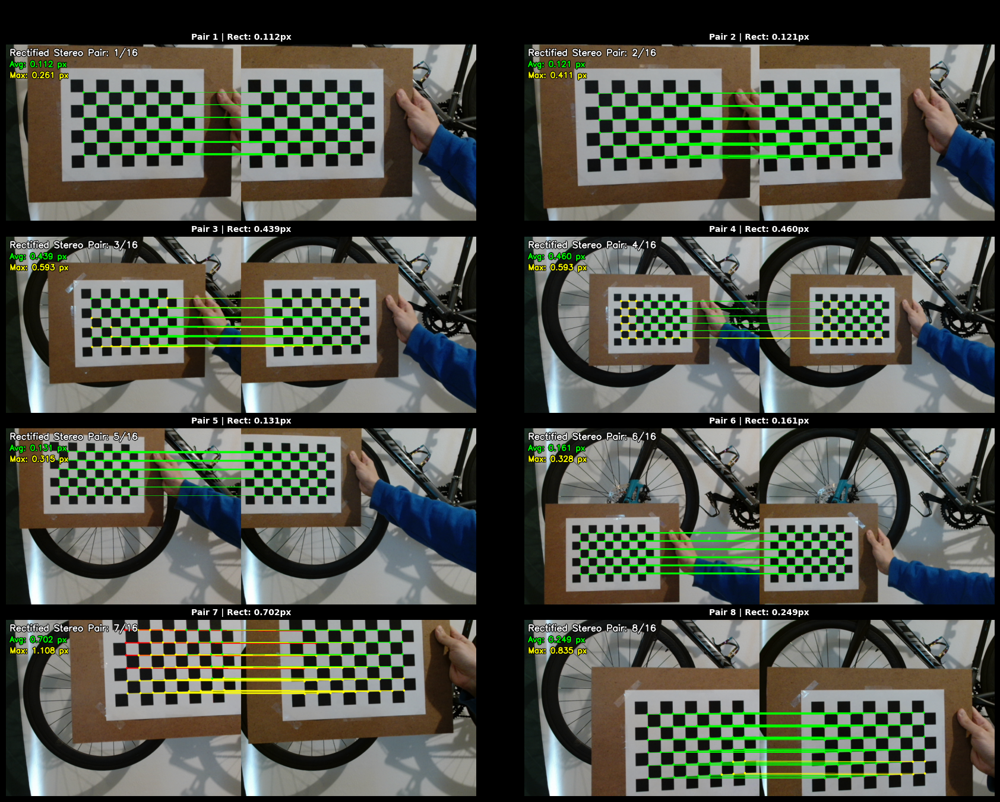

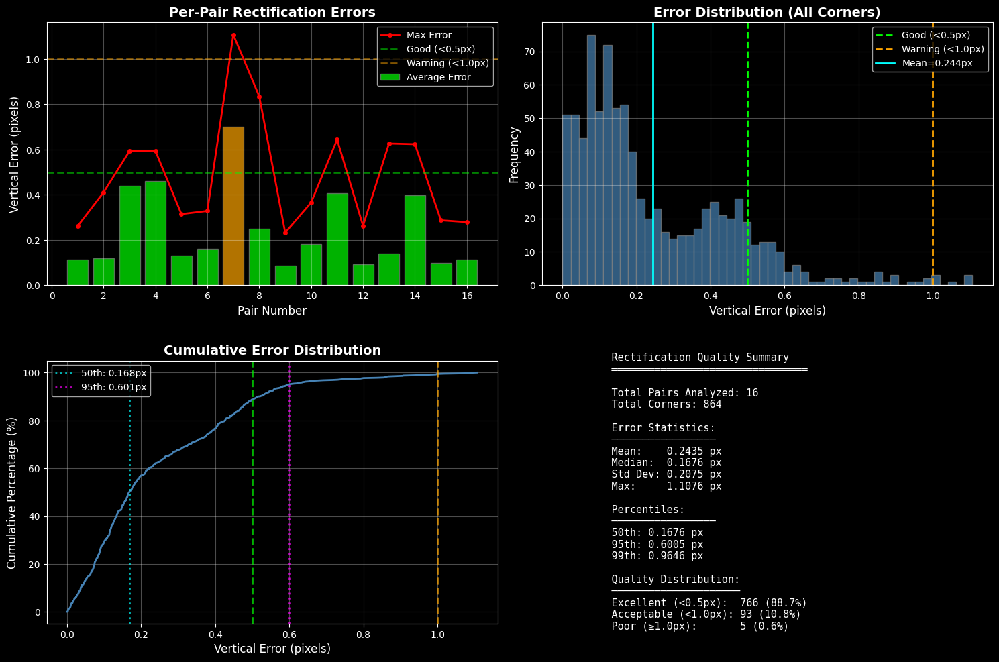


RECTIFICATION QUALITY ASSESSMENT
Overall Mean Error: 0.2435 px
95th Percentile:    0.6005 px
Quality Rating:     88.7% Excellent



In [200]:
def visualize_rectification(stereo_calib, stereo_left_imgs, stereo_right_imgs, 
                            stereo_left_corners, stereo_right_corners,
                            K_left, D_left, K_right, D_right, image_shape,
                            pattern_size, show_interactive=True, max_display=8):
    """
    Visualize stereo rectification quality by comparing:
    1. Undistorted-only images (top) - distortion removed but epipolar lines not aligned
    2. Fully rectified images (bottom) - distortion removed AND epipolar lines aligned
    """
    width, height = image_shape
    
    # Thresholds for error color coding
    ERROR_THRESH_GOOD = 0.5   # Green: excellent alignment
    ERROR_THRESH_WARN = 1.0   # Yellow: acceptable
    # Red: poor alignment (> 1.0px)
    
    print(f"Computing stereo rectification...")
    
    # 1. Compute rectification transforms
    # alpha=0: no invalid pixels (cropped), alpha=1: all pixels retained
    R1, R2, P1, P2, Q, roi1, roi2 = cv2.stereoRectify(
        K_left, D_left, K_right, D_right,
        (width, height),
        stereo_calib['R'], stereo_calib['T'],
        alpha=0  # Crop to valid pixels only
    )
    
    # 2. Compute rectification maps
    map1_L, map2_L = cv2.initUndistortRectifyMap(K_left, D_left, R1, P1, (width, height), cv2.CV_32FC1)
    map1_R, map2_R = cv2.initUndistortRectifyMap(K_right, D_right, R2, P2, (width, height), cv2.CV_32FC1)

    # 2.1 For comparison, also compute undistort-only maps (no rectification) to show the difference
    map1_L_undist, map2_L_undist = cv2.initUndistortRectifyMap(K_left, D_left, np.eye(3), K_left, (width, height), cv2.CV_32FC1)
    map1_R_undist, map2_R_undist = cv2.initUndistortRectifyMap(K_right, D_right, np.eye(3), K_right, (width, height), cv2.CV_32FC1)
    
    print(f"Analyzing {len(stereo_left_imgs)} stereo pairs...")
    print("Detecting corners on RECTIFIED images (epipolar geometry validation)\n")
    
    # Storage for results
    all_errors = []
    pair_results = []
    visualizations = []
    
    for idx, (img_L, img_R) in enumerate(zip(stereo_left_imgs, stereo_right_imgs)):
        # A.1 Rectify images
        rectL = cv2.remap(img_L, map1_L, map2_L, cv2.INTER_LINEAR)
        rectR = cv2.remap(img_R, map1_R, map2_R, cv2.INTER_LINEAR)

        # A.2 Undistort only (no rectification)
        undist_L = cv2.remap(img_L, map1_L_undist, map2_L_undist, cv2.INTER_LINEAR)
        undist_R = cv2.remap(img_R, map1_R_undist, map2_R_undist, cv2.INTER_LINEAR)
        
        # Convert to grayscale if needed
        if len(rectL.shape) == 3:
            grayL = cv2.cvtColor(rectL, cv2.COLOR_BGR2GRAY)
            grayR = cv2.cvtColor(rectR, cv2.COLOR_BGR2GRAY)
            gray_undist_L = cv2.cvtColor(undist_L, cv2.COLOR_BGR2GRAY)
            gray_undist_R = cv2.cvtColor(undist_R, cv2.COLOR_BGR2GRAY)
        else:
            grayL, grayR = rectL, rectR
        
        # B. Detect corners on rectified images
        flags = cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK
        retL, cornersL = cv2.findChessboardCorners(grayL, pattern_size, flags)
        retR, cornersR = cv2.findChessboardCorners(grayR, pattern_size, flags)
        # B.1 Also detect on undistorted-only images for comparison
        ret_undist_L, corners_undist_L = cv2.findChessboardCorners(gray_undist_L, pattern_size, flags)
        ret_undist_R, corners_undist_R = cv2.findChessboardCorners(gray_undist_R, pattern_size, flags)
        
        vis_undist = None
        vis = None

        # Process undistorted pair
        if ret_undist_L and ret_undist_R:
            term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
            corners_undist_L = cv2.cornerSubPix(gray_undist_L, corners_undist_L, (11, 11), (-1, -1), term)
            corners_undist_R = cv2.cornerSubPix(gray_undist_R, corners_undist_R, (11, 11), (-1, -1), term)
            
            pts_undist_L = corners_undist_L.reshape(-1, 2)
            pts_undist_R = corners_undist_R.reshape(-1, 2)
            
            vis_undist, avg_err_undist, max_err_undist = draw_rectification_links(
                undist_L, undist_R, pts_undist_L, pts_undist_R, ERROR_THRESH_GOOD, ERROR_THRESH_WARN
            )
            
            # Show interactive visualization
            if show_interactive:
                # Add text overlays
                cv2.putText(vis_undist, f"Raw Stereo Pair:  {idx+1}/{len(stereo_left_imgs)}", 
                           (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 0), 6)
                cv2.putText(vis_undist, f"Raw Stereo Pair:  {idx+1}/{len(stereo_left_imgs)}", 
                           (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
                cv2.putText(vis_undist, f"Avg: {avg_err_undist:.3f} px", 
                           (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 6)
                cv2.putText(vis_undist, f"Avg: {avg_err_undist:.3f} px", 
                           (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
                cv2.putText(vis_undist, f"Max: {max_err_undist:.3f} px", 
                           (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 6)
                cv2.putText(vis_undist, f"Max: {max_err_undist:.3f} px", 
                           (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)

        # Process rectified pair
        if retL and retR:
            # Refine corners
            term = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
            cornersL = cv2.cornerSubPix(grayL, cornersL, (11, 11), (-1, -1), term)
            cornersR = cv2.cornerSubPix(grayR, cornersR, (11, 11), (-1, -1), term)
            
            # Reshape to (N, 2)
            ptsL_rect = cornersL.reshape(-1, 2)
            ptsR_rect = cornersR.reshape(-1, 2)
            
            # C. Draw correspondence links with color coding
            vis, avg_err, max_err = draw_rectification_links(rectL, rectR, ptsL_rect, ptsR_rect,
                                                              ERROR_THRESH_GOOD, ERROR_THRESH_WARN)
            
            # Store results
            y_errors = np.abs(ptsL_rect[:, 1] - ptsR_rect[:, 1])
            all_errors.extend(y_errors)
            pair_results.append({
                'pair_id': idx,
                'avg_error': avg_err,
                'max_error': max_err,
                'num_corners': len(ptsL_rect),
                'errors': y_errors
            })
            
            print(f"Pair {idx+1}/{len(stereo_left_imgs)}: Avg={avg_err:.3f}px, Max={max_err:.3f}px")
            
            # Show interactive visualization
            if show_interactive:
                # Add text overlays
                cv2.putText(vis, f"Rectified Stereo Pair: {idx+1}/{len(stereo_left_imgs)}", 
                           (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 0), 6)
                cv2.putText(vis, f"Rectified Stereo Pair: {idx+1}/{len(stereo_left_imgs)}", 
                           (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255, 255, 255), 2)
                cv2.putText(vis, f"Avg: {avg_err:.3f} px", 
                           (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 6)
                cv2.putText(vis, f"Avg: {avg_err:.3f} px", 
                           (10, 60), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
                cv2.putText(vis, f"Max: {max_err:.3f} px", 
                           (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 6)
                cv2.putText(vis, f"Max: {max_err:.3f} px", 
                           (10, 90), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)
                
        else:
            print(f"Pair {idx+1}/{len(stereo_left_imgs)}: Board not detected in both rectified images")

        if show_interactive and vis is not None and vis_undist is not None:
            visualizations.append({
                'image': vis,
                'pair_id': idx,
                'avg_error': avg_err,
                'max_error': max_err
            })

            vis_stacked = np.vstack([vis_undist, vis])
            cv2.imshow('Rectification Comparison', vis_stacked)
            key = cv2.waitKey(0) & 0xFF
            if key == 27 or key == ord('q'):  # ESC or 'q' to exit early
                print("Exiting visualization...")
                break
    
    if show_interactive:
        cv2.destroyAllWindows()

    # D .Plot visualizations in grid
    if len(visualizations) > 0:
        plot_rectification_comparison_grid(visualizations[:max_display])
    
    # E. Create summary plots
    if len(pair_results) > 0:
        all_errors_array = np.array(all_errors)
        create_rectification_plots(pair_results, all_errors_array, ERROR_THRESH_GOOD, ERROR_THRESH_WARN)
    
    return {
        'R1': R1, 'R2': R2, 'P1': P1, 'P2': P2, 'Q': Q,
        'map1_L': map1_L, 'map2_L': map2_L,
        'map1_R': map1_R, 'map2_R': map2_R,
        'pair_results': pair_results,
        'all_errors': np.array(all_errors)
    }


def draw_rectification_links(imgL, imgR, ptsL, ptsR, thresh_good, thresh_warn):
    """
    Draw correspondence lines between left and right rectified images.
    Color-coded by vertical alignment error.
    """
    # Convert to BGR if grayscale
    if len(imgL.shape) == 2:
        outL = cv2.cvtColor(imgL, cv2.COLOR_GRAY2BGR)
        outR = cv2.cvtColor(imgR, cv2.COLOR_GRAY2BGR)
    else:
        outL = imgL.copy()
        outR = imgR.copy()
    
    combined = np.hstack((outL, outR))
    h, w = outL.shape[:2]
    errors = []
    
    for pt1, pt2 in zip(ptsL, ptsR):
        # Calculate vertical error (should be near zero after rectification)
        y_diff = abs(pt1[1] - pt2[1])
        errors.append(y_diff)
        
        # Integer coordinates for drawing
        xL, yL = int(round(pt1[0])), int(round(pt1[1]))
        xR, yR = int(round(pt2[0])), int(round(pt2[1]))
        
        # Color coding based on error
        if y_diff < thresh_good:
            color = (0, 255, 0)      # Green: excellent
            thickness = 1
        elif y_diff < thresh_warn:
            color = (0, 255, 255)    # Yellow: acceptable
            thickness = 1
        else:
            color = (0, 0, 255)      # Red: poor
            thickness = 2
        
        pt_start = (xL, yL)
        pt_end = (xR + w, yR)
        
        cv2.circle(combined, pt_start, 3, color, -1)
        cv2.circle(combined, pt_end, 3, color, -1)
        cv2.line(combined, pt_start, pt_end, color, thickness)
    
    return combined, np.mean(errors), np.max(errors)

def create_rectification_plots(pair_results, all_errors, thresh_good, thresh_warn):
    """
    Create comprehensive plots showing rectification quality metrics.
    """
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
        # Plot 1: Per-pair average errors
        pair_ids = [r['pair_id'] + 1 for r in pair_results]
        avg_errors = [r['avg_error'] for r in pair_results]
        max_errors = [r['max_error'] for r in pair_results]
        
        # Color bars by quality
        colors = ['lime' if e < thresh_good else 'orange' if e < thresh_warn else 'red' for e in avg_errors]
        axes[0, 0].bar(pair_ids, avg_errors, alpha=0.7, label='Average Error', color=colors, edgecolor='gray')
        axes[0, 0].plot(pair_ids, max_errors, 'r-o', label='Max Error', markersize=4, linewidth=2)
        axes[0, 0].axhline(thresh_good, color='lime', linestyle='--', alpha=0.5, linewidth=2, label=f'Good (<{thresh_good}px)')
        axes[0, 0].axhline(thresh_warn, color='orange', linestyle='--', alpha=0.5, linewidth=2, label=f'Warning (<{thresh_warn}px)')
        axes[0, 0].set_xlabel('Pair Number', fontsize=12)
        axes[0, 0].set_ylabel('Vertical Error (pixels)', fontsize=12)
        axes[0, 0].set_title('Per-Pair Rectification Errors', fontsize=14, fontweight='bold')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)
        
        # Plot 2: Error distribution histogram
        axes[0, 1].hist(all_errors, bins=50, color='steelblue', alpha=0.7, edgecolor='gray')
        axes[0, 1].axvline(thresh_good, color='lime', linestyle='--', linewidth=2, label=f'Good (<{thresh_good}px)')
        axes[0, 1].axvline(thresh_warn, color='orange', linestyle='--', linewidth=2, label=f'Warning (<{thresh_warn}px)')
        axes[0, 1].axvline(np.mean(all_errors), color='cyan', linestyle='-', linewidth=2, label=f'Mean={np.mean(all_errors):.3f}px')
        axes[0, 1].set_xlabel('Vertical Error (pixels)', fontsize=12)
        axes[0, 1].set_ylabel('Frequency', fontsize=12)
        axes[0, 1].set_title('Error Distribution (All Corners)', fontsize=14, fontweight='bold')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)
        
        # Plot 3: Cumulative error distribution
        sorted_errors = np.sort(all_errors)
        cumulative = np.arange(1, len(sorted_errors) + 1) / len(sorted_errors) * 100
        axes[1, 0].plot(sorted_errors, cumulative, linewidth=2, color='steelblue')
        axes[1, 0].axvline(thresh_good, color='lime', linestyle='--', alpha=0.7, linewidth=2)
        axes[1, 0].axvline(thresh_warn, color='orange', linestyle='--', alpha=0.7, linewidth=2)
        axes[1, 0].set_xlabel('Vertical Error (pixels)', fontsize=12)
        axes[1, 0].set_ylabel('Cumulative Percentage (%)', fontsize=12)
        axes[1, 0].set_title('Cumulative Error Distribution', fontsize=14, fontweight='bold')
        axes[1, 0].grid(True, alpha=0.3)
        
        # Add percentile annotations
        p50 = np.percentile(all_errors, 50)
        p95 = np.percentile(all_errors, 95)
        axes[1, 0].axvline(p50, color='cyan', linestyle=':', alpha=0.7, linewidth=2, label=f'50th: {p50:.3f}px')
        axes[1, 0].axvline(p95, color='magenta', linestyle=':', alpha=0.7, linewidth=2, label=f'95th: {p95:.3f}px')
        axes[1, 0].legend()
        
        # Plot 4: Quality summary statistics
        axes[1, 1].axis('off')
        
        # Calculate statistics
        total_corners = len(all_errors)
        good_count = np.sum(all_errors < thresh_good)
        warn_count = np.sum((all_errors >= thresh_good) & (all_errors < thresh_warn))
        poor_count = np.sum(all_errors >= thresh_warn)
        
        stats_text = f"""
    Rectification Quality Summary
    ════════════════════════════════
    
    Total Pairs Analyzed: {len(pair_results)}
    Total Corners: {total_corners}
    
    Error Statistics:
    ─────────────────
    Mean:    {np.mean(all_errors):.4f} px
    Median:  {np.median(all_errors):.4f} px
    Std Dev: {np.std(all_errors):.4f} px
    Max:     {np.max(all_errors):.4f} px
    
    Percentiles:
    ─────────────────
    50th: {np.percentile(all_errors, 50):.4f} px
    95th: {np.percentile(all_errors, 95):.4f} px
    99th: {np.percentile(all_errors, 99):.4f} px
    
    Quality Distribution:
    ─────────────────────
    Excellent (<{thresh_good}px):  {good_count} ({good_count/total_corners*100:.1f}%)
    Acceptable (<{thresh_warn}px): {warn_count} ({warn_count/total_corners*100:.1f}%)
    Poor (≥{thresh_warn}px):       {poor_count} ({poor_count/total_corners*100:.1f}%)
        """
        
        axes[1, 1].text(0.1, 0.5, stats_text, fontsize=11, family='monospace',
                        verticalalignment='center', transform=axes[1, 1].transAxes)
        
        plt.tight_layout()
        plt.show()
    
    print(f"\n{'='*60}")
    print(f"RECTIFICATION QUALITY ASSESSMENT")
    print(f"{'='*60}")
    print(f"Overall Mean Error: {np.mean(all_errors):.4f} px")
    print(f"95th Percentile:    {np.percentile(all_errors, 95):.4f} px")
    print(f"Quality Rating:     {good_count/total_corners*100:.1f}% Excellent")
    print(f"{'='*60}\n")

def plot_rectification_comparison_grid(visualizations):
    """Display stacked comparison images in grid."""
    if len(visualizations) == 0:
        print("No visualizations to display")
        return
    
    num_vis = len(visualizations)
    cols = 2
    rows = (num_vis + cols - 1) // cols
    
    # Calculate figure size based on actual image dimensions
    first_img = visualizations[0]['image']
    img_h, img_w = first_img.shape[:2]
    aspect_ratio = img_h / img_w
    
    # Set column width (inches) and calculate row height to maintain aspect ratio
    col_width = 9  # Width per column in inches
    row_height = col_width * aspect_ratio
    
    fig_width = col_width * cols
    fig_height = row_height * rows
    
    with plt.style.context('dark_background'):
        fig, axes = plt.subplots(rows, cols, figsize=(fig_width, fig_height))
        if num_vis == 1:
            axes = [axes]
        else:
            axes = axes.flatten()
    
    for idx, vis_data in enumerate(visualizations):
        img = vis_data['image']
        pair_id = vis_data['pair_id']
        
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[idx].imshow(img_rgb, aspect='equal')
        axes[idx].set_title(
            f"Pair {pair_id+1} | Rect: {vis_data['avg_error']:.3f}px", 
            fontsize=10, fontweight='bold'
        )
        axes[idx].axis('off')
    
    for idx in range(num_vis, len(axes)):
        axes[idx].axis('off')
    
    plt.suptitle('Rectified Results', 
                 fontsize=14, fontweight='bold', y=0.998)
    plt.tight_layout(h_pad=0.5, w_pad=0.5)
    plt.show()


# Visualize rectification with the captured stereo pairs
if len(stereo_left_imgs) > 0 and 'stereo_refined' in locals():
    rect_results = visualize_rectification(
        stereo_refined,
        stereo_left_imgs,
        stereo_right_imgs,
        stereo_left_corners,
        stereo_right_corners,
        K_left, D_left,
        K_right, D_right,
        (width, height),
        (PATTERN_SQUARES_X, PATTERN_SQUARES_Y),
        show_interactive=True  # Set to False to skip interactive display
    )

#### Save/Load Functions:

In [ ]:
def save_stereo_calibration(stereo_calib, rect_results, K_left, D_left, K_right, D_right, 
                            image_shape, stereo_left_imgs=None, stereo_right_imgs=None, filename='stereo_params.npz'):
    """
    Save all stereo calibration and rectification parameters to file.
    
    This includes:
    - Monocular intrinsics (K, D for both cameras)
    - Stereo extrinsics (R, T between cameras)
    - Rectification transforms (R1, R2, P1, P2, Q)
    - Rectification maps for fast remapping
    - Calibration quality metrics
    - Images - optional
    """
    print(f"Saving stereo calibration to {filename}...")
    
    np.savez(filename,
             # Monocular intrinsics
             K_left=K_left,
             D_left=D_left,
             K_right=K_right,
             D_right=D_right,
             
             # Stereo extrinsics
             R=stereo_calib['R'],
             T=stereo_calib['T'],
             E=stereo_calib['E'],
             F=stereo_calib['F'],
             
             # Rectification transforms
             R1=rect_results['R1'],
             R2=rect_results['R2'],
             P1=rect_results['P1'],
             P2=rect_results['P2'],
             Q=rect_results['Q'],
             
             # Rectification maps (for fast remapping)
             map1_L=rect_results['map1_L'],
             map2_L=rect_results['map2_L'],
             map1_R=rect_results['map1_R'],
             map2_R=rect_results['map2_R'],
             
             # Metadata
             baseline_mm=stereo_calib['baseline_mm'],
             rotation_deg=stereo_calib['rotation_deg'],
             rms_error=stereo_calib['rms_error'],
             num_images=stereo_calib['num_images'],
             image_shape=image_shape
    )

    # Save images to folder if provided
    if stereo_left_imgs is not None and stereo_right_imgs is not None:
        # Create folder based on filename
        base_name = "stereo"
        images_folder = f"{base_name}_dataset"
        os.makedirs(images_folder, exist_ok=True)
        
        print(f"\nSaving {len(stereo_left_imgs)} image pairs to {images_folder}/...")
        
        for i, (left_img, right_img) in enumerate(zip(stereo_left_imgs, stereo_right_imgs)):
            left_filename = os.path.join(images_folder, f'left_{i:03d}.png')
            right_filename = os.path.join(images_folder, f'right_{i:03d}.png')
            
            cv2.imwrite(left_filename, left_img)
            cv2.imwrite(right_filename, right_img)

    print(f"Saved successfully!")
    print(f"\nSaved parameters:")
    print(f"- Intrinsics: K_left, D_left, K_right, D_right")
    print(f"- Stereo: R, T, E, F")
    print(f"- Rectification: R1, R2, P1, P2, Q")
    print(f"- Remap tables: map1_L, map2_L, map1_R, map2_R")
    print(f"- Metadata: baseline, rotation, RMS error")


def load_stereo_calibration(filename='stereo_params.npz'):
    """
    Load stereo calibration parameters from file.
    
    Returns a dictionary with all calibration parameters.
    """
    print(f"Loading stereo calibration from {filename}...")
    
    data = np.load(filename)
    
    params = {
        # Monocular intrinsics
        'K_left': data['K_left'],
        'D_left': data['D_left'],
        'K_right': data['K_right'],
        'D_right': data['D_right'],
        
        # Stereo extrinsics
        'R': data['R'],
        'T': data['T'],
        'E': data['E'],
        'F': data['F'],
        
        # Rectification transforms
        'R1': data['R1'],
        'R2': data['R2'],
        'P1': data['P1'],
        'P2': data['P2'],
        'Q': data['Q'],
        
        # Rectification maps
        'map1_L': data['map1_L'],
        'map2_L': data['map2_L'],
        'map1_R': data['map1_R'],
        'map2_R': data['map2_R'],
        
        # Metadata
        'baseline_mm': float(data['baseline_mm']),
        'rotation_deg': data['rotation_deg'],
        'rms_error': float(data['rms_error']),
        'num_images': int(data['num_images']),
        'image_shape': tuple(data['image_shape'])
    }
    
    print(f"Loaded successfully!")
    print(f"\nBaseline: {params['baseline_mm']:.2f} mm")
    print(f"RMS Error: {params['rms_error']:.4f} px")
    print(f"Calibrated with: {params['num_images']} image pairs")
    print(f"Image size: {params['image_shape']}")
    
    return params


# Save stereo calibration and rectification parameters
if 'stereo_refined' in locals() and 'rect_results' in locals():
    save_stereo_calibration(
        stereo_refined,
        rect_results,
        K_left, D_left,
        K_right, D_right,
        (width, height),
        stereo_left_imgs, stereo_right_imgs,
        filename='stereo_params.npz'
    )
else:
    print("Please complete stereo calibration and rectification first")

Saving stereo calibration to stereo_params.npz...
Saved successfully!

Saved parameters:
- Intrinsics: K_left, D_left, K_right, D_right
- Stereo: R, T, E, F
- Rectification: R1, R2, P1, P2, Q
- Remap tables: map1_L, map2_L, map1_R, map2_R
- Metadata: baseline, rotation, RMS error


---
## 6. Live Rectified Stereo Demo

Real-time visualization of the complete stereo pipeline: **undistortion + rectification**.

This demo demonstrates the quality of your stereo calibration by showing:
- **Side-by-side rectified views** from both cameras
- **Horizontal epipolar lines** (green) showing the rectified geometry
- **Corner correspondences** with lines connecting matching points
- **Color-coded alignment quality**:
  - Green: Excellent (< 0.5px vertical offset)
  - Yellow: Good (< 1.0px vertical offset)  
  - Red: Poor (≥ 1.0px vertical offset)
- **Real-time statistics** showing mean/max vertical offsets

The vertical offset between corresponding points should be near zero after proper rectification, validating that the epipolar lines are truly horizontal and parallel.

**Controls:**
- **ESC or 'q'**: Exit the demo
- **SPACE**: Freeze/unfreeze the current frame for detailed inspection
- **'s'**: Save current rectified left and right frames to disk

In [ ]:
def live_rectified_stereo_demo(rect_params, K_left, D_left, K_right, D_right, 
                                pattern_size, cam_left_idx=2, cam_right_idx=0):
    """
    Live stereo rectification demo with corner detection and epipolar alignment visualization.
    
    Shows:
    - Rectified left and right images side-by-side
    - Detected chessboard corners
    - Horizontal epipolar lines (green)
    - Correspondence lines between corners (color-coded by Y offset)
    - Real-time Y offset statistics
    """
    print("Starting live rectified stereo demo...")
    print("Controls:")
    print("  - ESC or 'q': Exit")
    print("  - SPACE: Freeze/unfreeze")
    print("  - 's': Save current frame\n")
    
    # Extract rectification parameters
    map1_L, map2_L = rect_params['map1_L'], rect_params['map2_L']
    map1_R, map2_R = rect_params['map1_R'], rect_params['map2_R']
    
    # Open cameras
    cap_left = cv2.VideoCapture(cam_left_idx, cv2.CAP_DSHOW)
    cap_right = cv2.VideoCapture(cam_right_idx, cv2.CAP_DSHOW)
    
    if not (cap_left.isOpened() and cap_right.isOpened()):
        print("Error: Could not open cameras")
        return
    
    # Configure cameras
    for cap in [cap_left, cap_right]:
        cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
        cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
        cap.set(cv2.CAP_PROP_AUTOFOCUS, 0)
    
    print("Cameras initialized")
    
    # Corner detection parameters
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    
    # Error thresholds
    THRESH_GOOD = 0.5
    THRESH_WARN = 1.0
    
    frozen = False
    frame_left_frozen = None
    frame_right_frozen = None
    save_counter = 0
    
    try:
        while True:
            if not frozen:
                ret_left, frame_left = cap_left.read()
                ret_right, frame_right = cap_right.read()
                
                if not (ret_left and ret_right):
                    print("Error reading frames")
                    break
                
                frame_left_frozen = frame_left.copy()
                frame_right_frozen = frame_right.copy()
            else:
                frame_left = frame_left_frozen.copy()
                frame_right = frame_right_frozen.copy()
            
            # Apply rectification
            rect_left = cv2.remap(frame_left, map1_L, map2_L, cv2.INTER_LINEAR)
            rect_right = cv2.remap(frame_right, map1_R, map2_R, cv2.INTER_LINEAR)
            
            # Convert to grayscale for detection
            gray_left = cv2.cvtColor(rect_left, cv2.COLOR_BGR2GRAY)
            gray_right = cv2.cvtColor(rect_right, cv2.COLOR_BGR2GRAY)
            
            # Detect corners
            found_left, corners_left = cv2.findChessboardCorners(
                gray_left, pattern_size, 
                cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK
            )
            found_right, corners_right = cv2.findChessboardCorners(
                gray_right, pattern_size,
                cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK
            )
            
            # Create visualization
            vis_left = rect_left.copy()
            vis_right = rect_right.copy()
            h, w = vis_left.shape[:2]
            
            # Draw horizontal epipolar lines
            for y in range(0, h, 40):
                cv2.line(vis_left, (0, y), (w, y), (0, 255, 0), 1)
                cv2.line(vis_right, (0, y), (w, y), (0, 255, 0), 1)
            
            status_text = []
            
            if found_left and found_right:
                # Refine corners
                corners_left = cv2.cornerSubPix(gray_left, corners_left, (11, 11), (-1, -1), criteria)
                corners_right = cv2.cornerSubPix(gray_right, corners_right, (11, 11), (-1, -1), criteria)
                
                # Draw corners
                cv2.drawChessboardCorners(vis_left, pattern_size, corners_left, found_left)
                cv2.drawChessboardCorners(vis_right, pattern_size, corners_right, found_right)
                
                # Compute Y offsets and draw correspondence lines
                corners_left_pts = corners_left.reshape(-1, 2)
                corners_right_pts = corners_right.reshape(-1, 2)
                
                y_offsets = []
                combined = np.hstack([vis_left, vis_right])
                
                for pt_l, pt_r in zip(corners_left_pts, corners_right_pts):
                    y_offset = abs(pt_l[1] - pt_r[1])
                    y_offsets.append(y_offset)
                    
                    # Color code by offset
                    if y_offset < THRESH_GOOD:
                        color = (0, 255, 0)  # Green: excellent
                        thickness = 1
                    elif y_offset < THRESH_WARN:
                        color = (0, 255, 255)  # Yellow: acceptable
                        thickness = 1
                    else:
                        color = (0, 0, 255)  # Red: poor
                        thickness = 2
                    
                    # Draw correspondence line
                    pt1 = (int(pt_l[0]), int(pt_l[1]))
                    pt2 = (int(pt_r[0]) + w, int(pt_r[1]))
                    cv2.line(combined, pt1, pt2, color, thickness)
                    
                    # Draw corner circles
                    cv2.circle(combined, pt1, 3, color, -1)
                    cv2.circle(combined, pt2, 3, color, -1)
                
                # Compute statistics
                y_offsets = np.array(y_offsets)
                mean_offset = np.mean(y_offsets)
                max_offset = np.max(y_offsets)
                good_count = np.sum(y_offsets < THRESH_GOOD)
                total_count = len(y_offsets)
                
                status_text.append(f"Corners: {total_count}")
                status_text.append(f"Mean Y-offset: {mean_offset:.3f} px")
                status_text.append(f"Max Y-offset: {max_offset:.3f} px")
                status_text.append(f"Excellent: {good_count}/{total_count} ({100*good_count/total_count:.0f}%)")
                
                # Quality indicator
                if mean_offset < THRESH_GOOD:
                    status_text.append("Quality: EXCELLENT")
                    quality_color = (0, 255, 0)
                elif mean_offset < THRESH_WARN:
                    status_text.append("Quality: GOOD")
                    quality_color = (0, 255, 255)
                else:
                    status_text.append("Quality: POOR")
                    quality_color = (0, 0, 255)
                
                vis_combined = combined
            else:
                # No detection - just stack images
                vis_combined = np.hstack([vis_left, vis_right])
                status_text.append("Status: No chessboard detected")
                quality_color = (128, 128, 128)
            
            # Add status overlay
            overlay_h = 140
            overlay = np.zeros((overlay_h, vis_combined.shape[1], 3), dtype=np.uint8)
            
            # Add text
            y_pos = 25
            if frozen:
                cv2.putText(overlay, "FROZEN", (10, y_pos), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)
                y_pos += 30
            
            for i, text in enumerate(status_text):
                cv2.putText(overlay, text, (10, y_pos + i*25), 
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, quality_color if i == len(status_text)-1 else (255, 255, 255), 2)
            
            # Add legend
            legend_x = vis_combined.shape[1] - 250
            cv2.putText(overlay, "Legend:", (legend_x, 25), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
            cv2.circle(overlay, (legend_x + 10, 45), 4, (0, 255, 0), -1)
            cv2.putText(overlay, f"< {THRESH_GOOD}px", (legend_x + 20, 50), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
            cv2.circle(overlay, (legend_x + 10, 70), 4, (0, 255, 255), -1)
            cv2.putText(overlay, f"< {THRESH_WARN}px", (legend_x + 20, 75), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
            cv2.circle(overlay, (legend_x + 10, 95), 4, (0, 0, 255), -1)
            cv2.putText(overlay, f">= {THRESH_WARN}px", (legend_x + 20, 100), 
                       cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
            
            # Combine visualization and overlay
            final_display = np.vstack([vis_combined, overlay])
            
            cv2.imshow('Live Rectified Stereo - Epipolar Alignment', final_display)
            
            key = cv2.waitKey(1) & 0xFF
            if key == 27 or key == ord('q'):  # ESC or 'q'
                break
            elif key == ord(' '):  # SPACE
                frozen = not frozen
                print(f"{'Frozen' if frozen else 'Unfrozen'}")
            elif key == ord('s'):  # Save
                save_counter += 1
                filename_left = f'rectified_left_{save_counter}.png'
                filename_right = f'rectified_right_{save_counter}.png'
                cv2.imwrite(filename_left, rect_left)
                cv2.imwrite(filename_right, rect_right)
                print(f"Saved: {filename_left}, {filename_right}")
    
    finally:
        cap_left.release()
        cap_right.release()
        cv2.destroyAllWindows()
        print("Demo stopped.")


# Run the live rectified stereo demo
if 'rect_results' in locals():
    live_rectified_stereo_demo(
        rect_results,
        K_left, D_left, K_right, D_right,
        (PATTERN_SQUARES_X, PATTERN_SQUARES_Y),
        cam_left_idx=cam_left_idx,
        cam_right_idx=cam_right_idx
    )
else:
    print("rect_results not found in locals, loading from file...")
    loaded_params = load_stereo_calibration('stereo_params.npz')

    # Extract parameters
    K_left = loaded_params['K_left']
    D_left = loaded_params['D_left']
    K_right = loaded_params['K_right']
    D_right = loaded_params['D_right']

    # Reconstruct rect_results dictionary
    rect_results = {
        'R1': loaded_params['R1'],
        'R2': loaded_params['R2'],
        'P1': loaded_params['P1'],
        'P2': loaded_params['P2'],
        'Q': loaded_params['Q'],
        'map1_L': loaded_params['map1_L'],
        'map2_L': loaded_params['map2_L'],
        'map1_R': loaded_params['map1_R'],
        'map2_R': loaded_params['map2_R']
    }

    print("Parameters loaded successfully!")
    live_rectified_stereo_demo(
            rect_results,
            K_left, D_left, K_right, D_right,
            (PATTERN_SQUARES_X, PATTERN_SQUARES_Y),
            cam_left_idx=cam_left_idx,
            cam_right_idx=cam_right_idx
        )

Starting live rectified stereo demo...
Controls:
  - ESC or 'q': Exit
  - SPACE: Freeze/unfreeze
  - 's': Save current frame

Cameras initialized
Frozen
Unfrozen
✓ Saved: rectified_left_1.png, rectified_right_1.png
✓ Saved: rectified_left_2.png, rectified_right_2.png
Demo stopped.
